In [1]:
%reload_ext autoreload
%autoreload 2

In [2]:
import corner
import numpy as np
import matplotlib.pyplot as plt
import math
import random

import sys 
sys.path.append('..')
from functions import *
# from colormaps import new_colors
cmap = plt.get_cmap('tab10')
new_colors = cmap(range(10))

3.0rc2


In [3]:
burnin = 1
thin = 1

def make_analysis_plots_hdf5(run):
    config = parse_config('/Users/fardila/Documents/GitHub/dwarf_lensing/MCMC/config/mcmc_config_{0}.yaml'.format(str(run)))
    config, cosmos_data, sim_data = initial_model(config)
    
    file_name = '/Users/fardila/Documents/GitHub/dwarf_lensing/MCMC/outfiles/UM_cosmos_bplanck_run_{0}.hdf5'.format(str(run))
    reader = emcee.backends.HDFBackend(file_name)

    chains = reader.get_chain()
    log_prob = reader.get_log_prob()
    
    print("burn-in: {0}".format(burnin))
    print("thin: {0}".format(thin))
    print('{0} walkers'.format(chains.shape[1]))
    print('{0} iterations per walker so far ({1} total)'.format(chains.shape[0],
                                                                chains.shape[0]*chains.shape[1]))
    
    #step plots
    f, axes = plt.subplots(7, 1, sharex=True, figsize=[10,30])

    for i, parameter in enumerate(chains.T):
        for walker in parameter:
            axes[i].plot(range(len(walker)), walker, color=new_colors[i], alpha=0.4)
            axes[i].set_ylabel(config['param_labels_latex'][i], color=new_colors[i], fontsize=30)
        axes[i].axvline(burnin, c='r')
    plt.xlabel('Step') 
    plt.show()
                         
    #plot best
    samples = np.concatenate(chains, axis=0) #concatenate chains (i.e. flatten array)
    best_params = samples[np.argmax(log_prob, axis=None)]
    
    #####
    #Discard burnin for corner plot
    ####
    samples = reader.get_chain(discard=burnin, flat=True, thin=thin)
    log_prob = reader.get_log_prob(discard=burnin, flat=True, thin=thin)
    print('{0} iterations being used total'.format(samples.shape[0]))
    
                         
    #corner plot
    fig = corner.corner(samples, labels=config['param_labels_latex'],
                      truths=config['param_ini'], truth_color='r')
    plt.show()
         
    #plots with best parameters    
    print(best_params)
    
    plot_from_params(best_params, config, cosmos_data, sim_data)
    plot_sigma_slope(run)
    
    plt.show()
                         
    return

def weighted_avg_and_std(values, weights):
    """
    Return the weighted average and standard deviation.

    values, weights -- Numpy ndarrays with the same shape.
    """
    average = np.average(values, weights=weights)
    # Fast and numerically precise:
    variance = np.average((values-average)**2, weights=weights)
    return (average, math.sqrt(variance))


def plot_sigma_slope(run):
    
    file_name = '/Users/fardila/Documents/GitHub/dwarf_lensing/MCMC/outfiles/UM_cosmos_bplanck_run_{0}.hdf5'.format(str(run))
    reader = emcee.backends.HDFBackend(file_name)
    
#     tau = reader.get_autocorr_time()
#     burnin = int(2*np.max(tau))
#     thin = int(0.5*np.min(tau))


    chains = reader.get_chain()
    log_prob = reader.get_log_prob()
    
    print("burn-in: {0}".format(burnin))
    print("thin: {0}".format(thin))
    print('{0} walkers'.format(chains.shape[1]))
    print('{0} iterations per walker so far ({1} total)'.format(chains.shape[0],
                                                                chains.shape[0]*chains.shape[1]))
    
    chains = reader.get_chain(discard=burnin, flat=True, thin=thin)
    log_prob = reader.get_log_prob(discard=burnin, flat=True, thin=thin)
    print('{0} iterations being used total'.format(chains.shape[0]))

    #only first 2 params
    sigma_2, sigma_3 =  chains.T[:2]

#     #flatten walker chains together
#     sigma_2_flat, sigma_3_flat = sigma_2.T.flatten(), sigma_3.T.flatten()
    
    #choose points to interpolate
    interp_Vs = np.linspace(2,3,30)
    interp_sigmas = [np.interp(interp_Vs, [2,3], [sigma2, sigma3]) for sigma2, sigma3 in zip(sigma_2, sigma_3)]
    
    #get means and sigmas
    means, stds = [], []
    for i, V in enumerate(interp_Vs):
        samples = [sigmas[i] for sigmas in interp_sigmas]
        mean, std = weighted_avg_and_std(samples, np.exp(log_prob))

        means.append(mean)
        stds.append(std)
        
    means = np.array(means)
    stds = np.array(stds)
        
    #plot
    fig, axes=plt.subplots(1,1, figsize=[6,6])
    
    #left subplot: Vmax@Mpeak
#     axes.errorbar(interp_Vs, means,yerr=stds,
#             c=plt.get_cmap('tab20')(0), linewidth=3, linestyle='--', marker='o', label = 'model')
    axes.plot(interp_Vs, means, c=plt.get_cmap('tab20')(0), linewidth=3, linestyle='--', label = 'model')
    axes.fill_between(interp_Vs, means+stds, means-stds,
                     color=plt.get_cmap('tab20')(0), alpha=0.3)
    axes.fill_between(interp_Vs, means+2*stds, means-2*stds,
                     color=plt.get_cmap('tab20')(0), alpha=0.2)

    axes.set_xlabel(r'$\log(V_{max}@M_{peak}$)', fontsize=25)
    axes.set_ylabel(r'$\sigma_{M_* | V_{max}@M_{peak}}$', fontsize=25)
    axes.legend()
    

    plt.show()

In [13]:
run='Vmax_4'
config = parse_config('/Users/fardila/Documents/GitHub/dwarf_lensing/MCMC/config/mcmc_config_{0}.yaml'.format(str(run)))
config, cosmos_data, sim_data = initial_model(config)


5SHMR+scatter (Vmax@Mpeak)


In [16]:
param=config['param_ini']
sim_data['model'] = PrebuiltSubhaloModelFactory('behroozi10', redshift=config['sim_z'],
                                        scatter_abscissa=[12, 15],
                                        scatter_ordinates=[param[0], param[1]])

In [15]:
def make_analysis_plots_npz(run):
    config = parse_config('/Users/fardila/Documents/GitHub/dwarf_lensing/MCMC/config/mcmc_config_{0}.yaml'.format(str(run)))
    config, cosmos_data, sim_data = initial_model(config)
    
    mcmc_array = np.load('/Users/fardila/Documents/GitHub/dwarf_lensing/MCMC/outfiles/UM_cosmos_bplanck_run_{}.npz'.format(str(run)))
    samples = mcmc_array['samples']
                         
    #corner plot
    fig = corner.corner(samples, labels=config['param_labels_latex'],
                      truths=config['param_ini'], truth_color='r')
    plt.show()
                         
    #step plots
    f, axes = plt.subplots(7, 1, sharex=True, figsize=[10,30])

    for walker in mcmc_array['chains']:
        for parameter in range(config['mcmc_ndims']):
            param_chain = [s[parameter] for s in walker]
            axes[parameter].plot(range(len(param_chain)), param_chain, color=new_colors[parameter], alpha=0.4)
            axes[parameter].set_ylabel(config['param_labels_latex'][parameter], color=new_colors[parameter], fontsize=30)
    plt.xlabel('Step') 
    plt.show()
                         
    #plot best
    plot_from_params(mcmc_array['best'], config, cosmos_data, sim_data)
    plt.show()
                         
    return mcmc_array

# run 1 

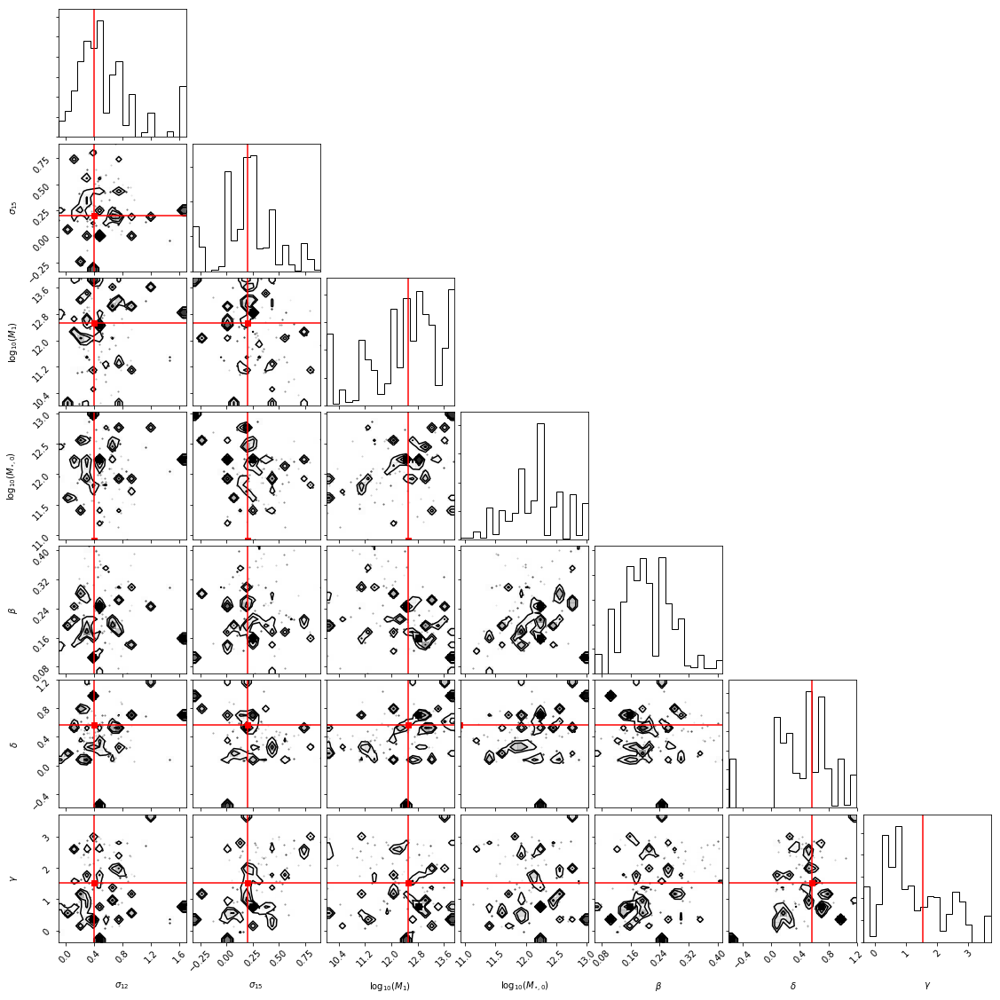

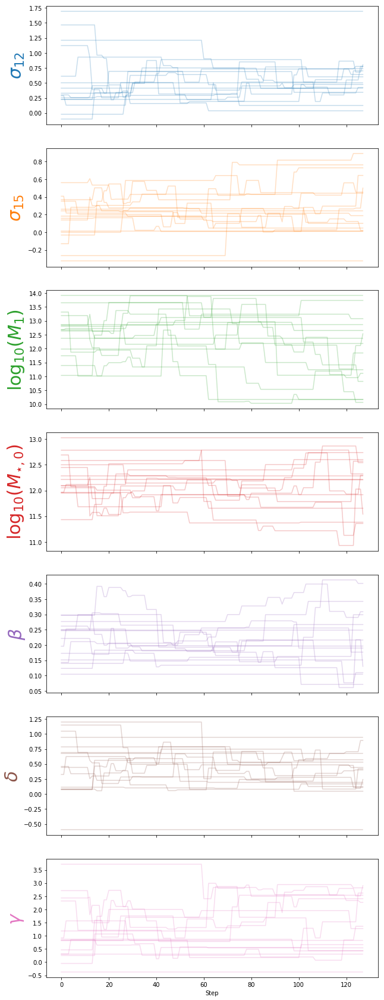

mock.populate
{u'smhm_beta_0': 0.3429365143064401, u'smhm_delta_0': 0.12515170098484457, u'smhm_m0_0': 12.738418876764625, u'smhm_m1_a': 0, u'smhm_m0_a': 0, u'smhm_beta_a': 0, u'smhm_gamma_0': 0.43421947842172237, u'smhm_gamma_a': 0, u'smhm_m1_0': 11.239953792701078, u'scatter_model_param2': 0.10106443741995232, u'smhm_delta_a': 0, u'scatter_model_param1': 0.6028827365584721}
SMF computed
cut galaxies table 1540938
Ks_2sampResult(statistic=0.000711007691810428, pvalue=0.9999999999999993)
DS computed


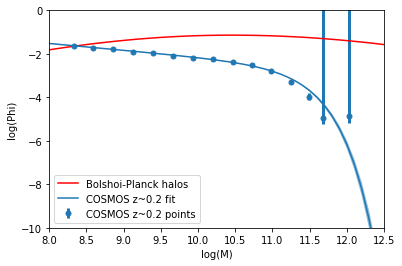

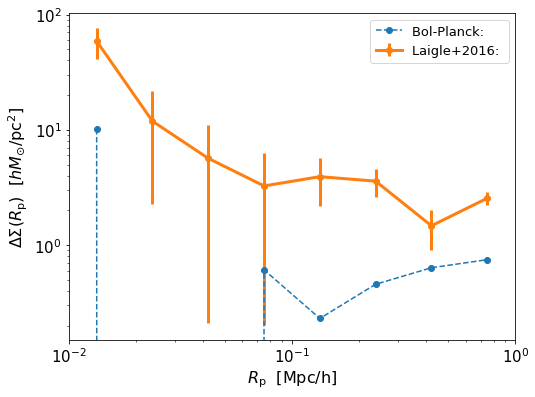

In [26]:
make_analysis_plots(1)

# run 2 

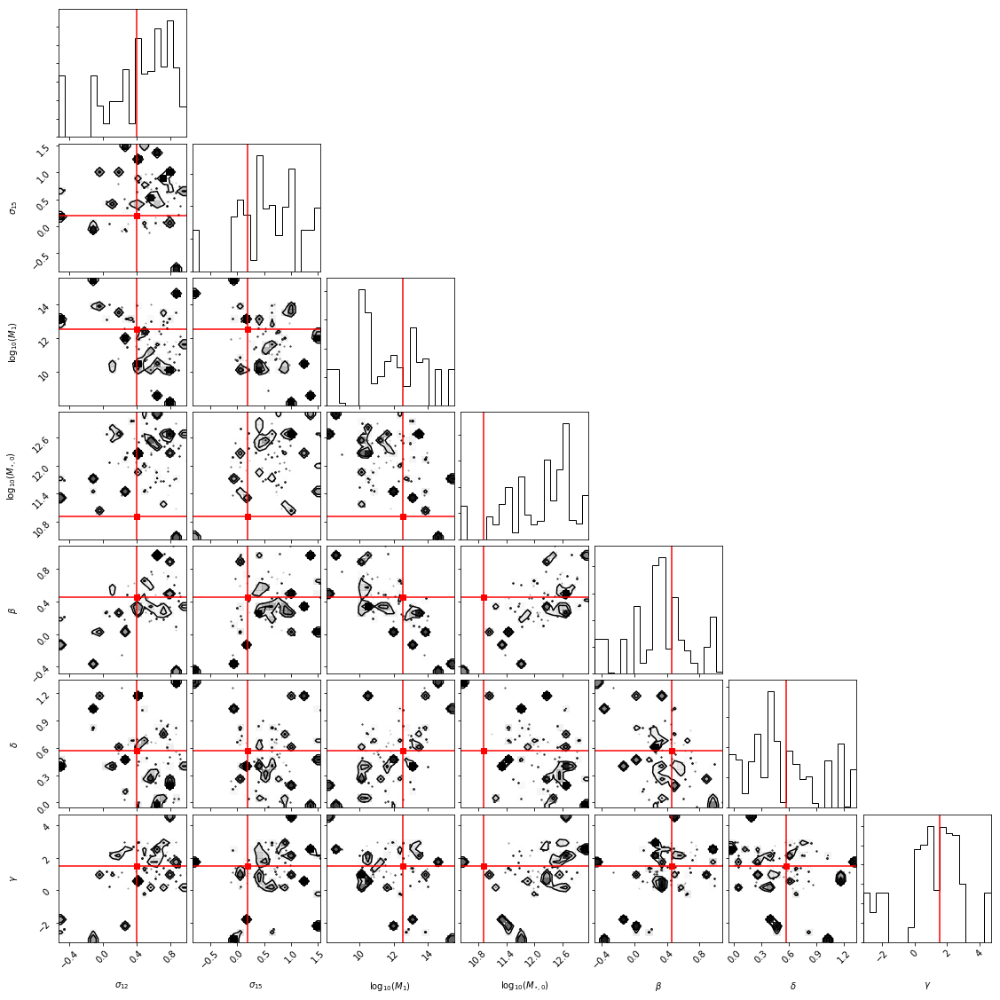

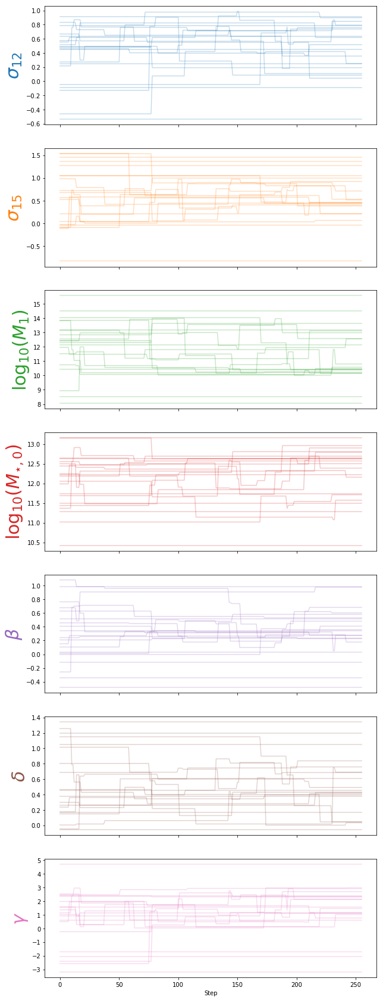

mock.populate
{u'smhm_beta_0': 0.5801694804438852, u'smhm_delta_0': 0.42980477666766714, u'smhm_m0_0': 12.8068185489355, u'smhm_m1_a': 0, u'smhm_m0_a': 0, u'smhm_beta_a': 0, u'smhm_gamma_0': 2.3292133615879163, u'smhm_gamma_a': 0, u'smhm_m1_0': 10.392839435519042, u'scatter_model_param2': 0.4080495514420702, u'smhm_delta_a': 0, u'scatter_model_param1': 0.08664164614453107}
SMF computed
cut galaxies table 0
Too few mock dwarfs!
DS computed


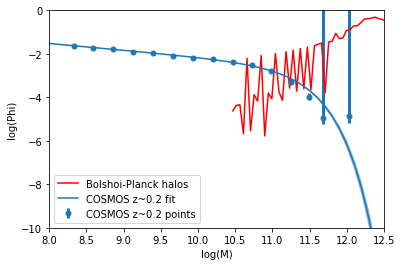

/Users/fardila/anaconda/envs/dwarf_lensing/lib/python2.7/site-packages/matplotlib/ticker.py:2207: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  "Data has no positive values, and therefore cannot be "


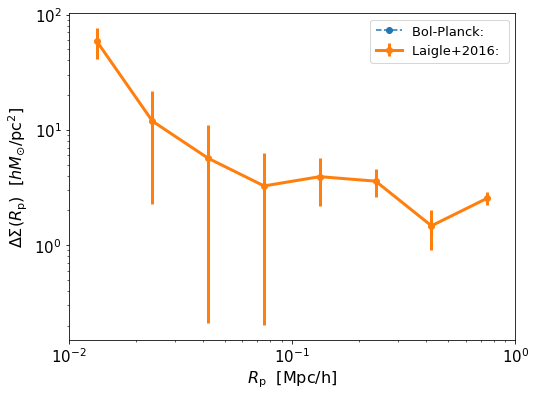

In [27]:
make_analysis_plots(2)

# run 3

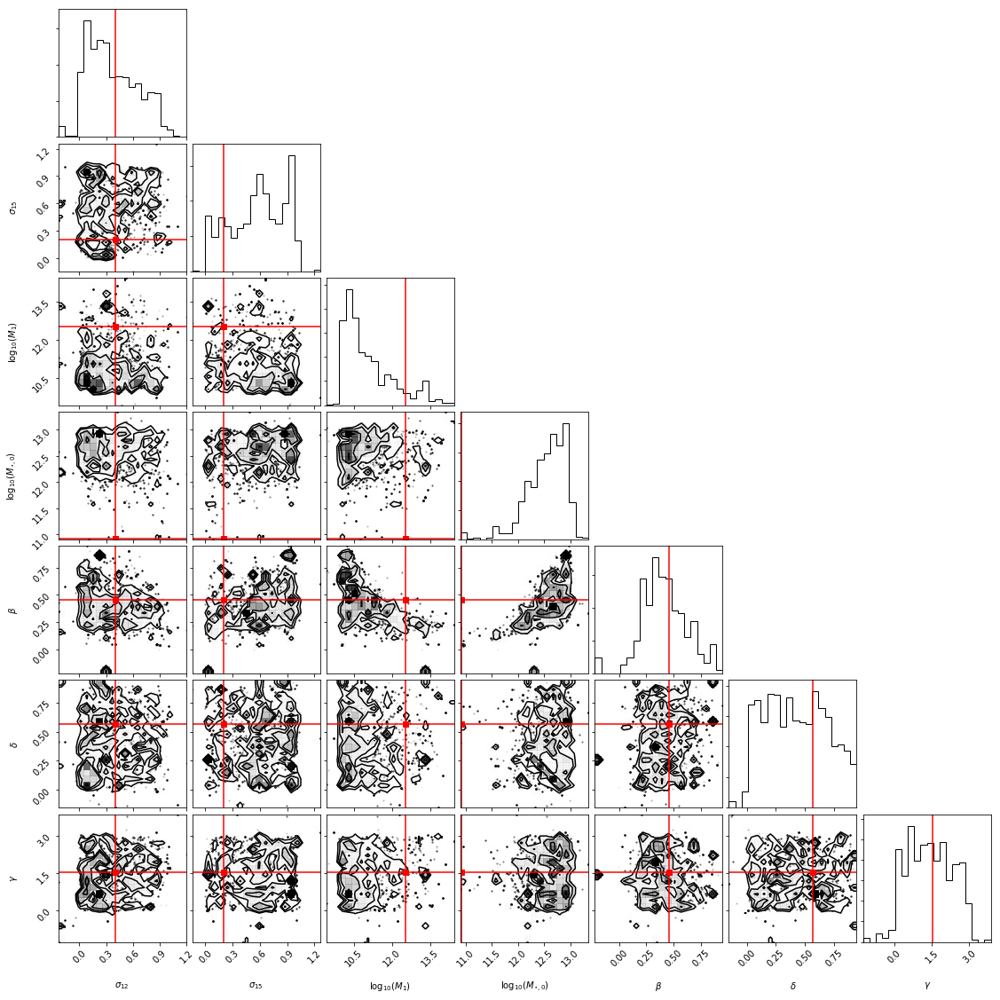

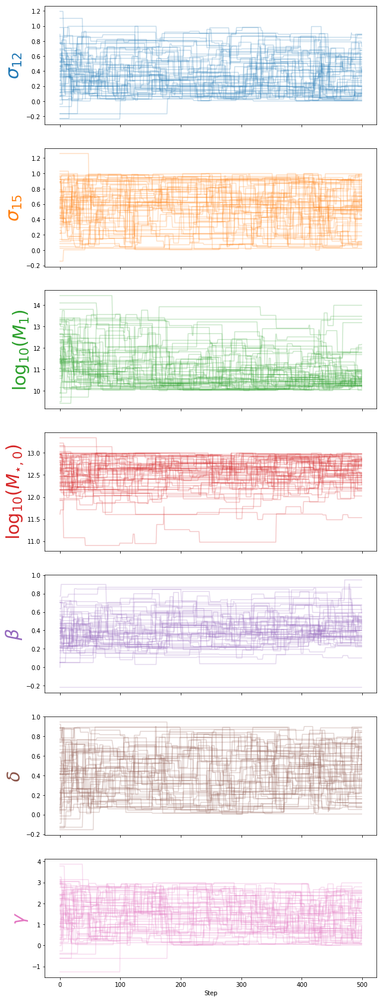

mock.populate
{u'smhm_beta_0': 0.5571910548265355, u'smhm_delta_0': 0.7911935781093474, u'smhm_m0_0': 12.985976535775238, u'smhm_m1_a': 0, u'smhm_m0_a': 0, u'smhm_beta_a': 0, u'smhm_gamma_0': 2.6376098416982683, u'smhm_gamma_a': 0, u'smhm_m1_0': 10.508778637183996, u'scatter_model_param2': 0.3191207208121521, u'smhm_delta_a': 0, u'scatter_model_param1': 0.5068560580784922}
SMF computed
cut galaxies table 1021
Too few mock dwarfs!
DS computed


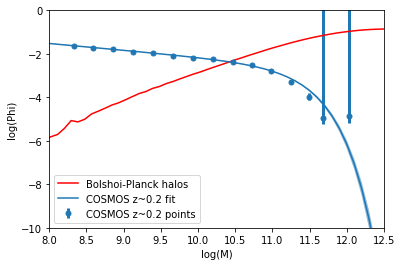

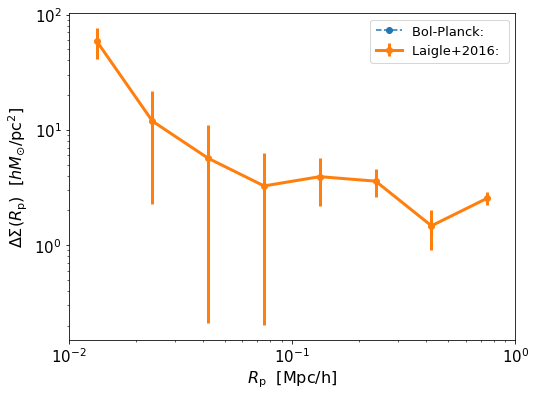

In [28]:
make_analysis_plots(3)

# run 4 

3.0rc1


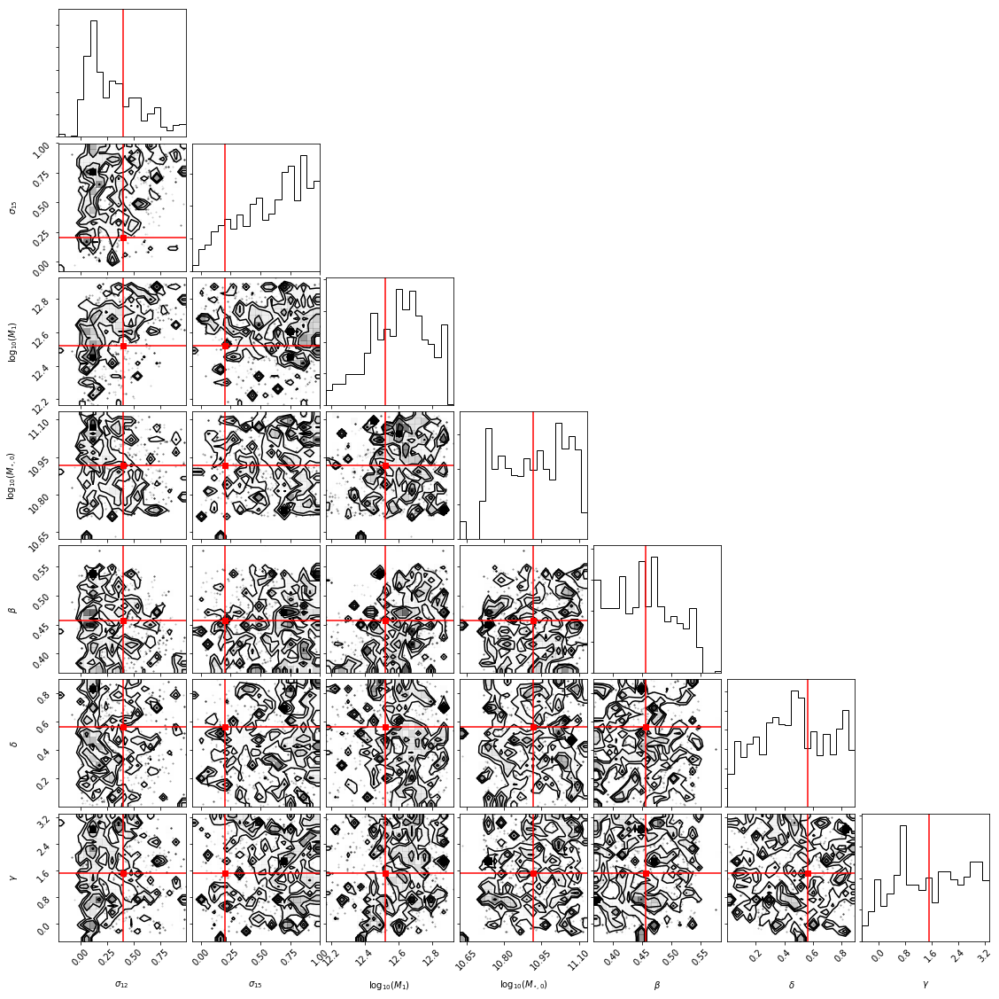

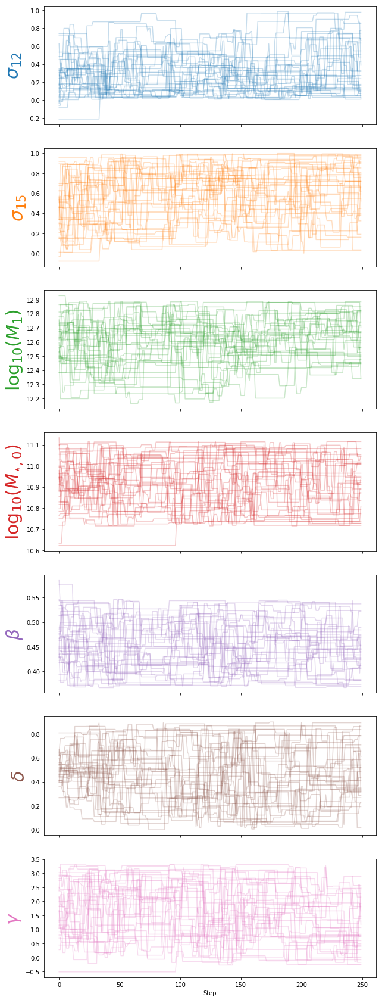

mock.populate
{u'smhm_beta_0': 0.4382279593705897, u'smhm_delta_0': 0.19259536635636484, u'smhm_m0_0': 10.718754050863726, u'smhm_m1_a': 0, u'smhm_m0_a': 0, u'smhm_beta_a': 0, u'smhm_gamma_0': 0.7423853399382417, u'smhm_gamma_a': 0, u'smhm_m1_0': 12.666570180725875, u'scatter_model_param2': 0.027782654222497982, u'smhm_delta_a': 0, u'scatter_model_param1': 0.2728266009911515}
SMF computed
cut galaxies table 849138


KeyboardInterrupt: 

In [32]:
make_analysis_plots(4)

# run 5 

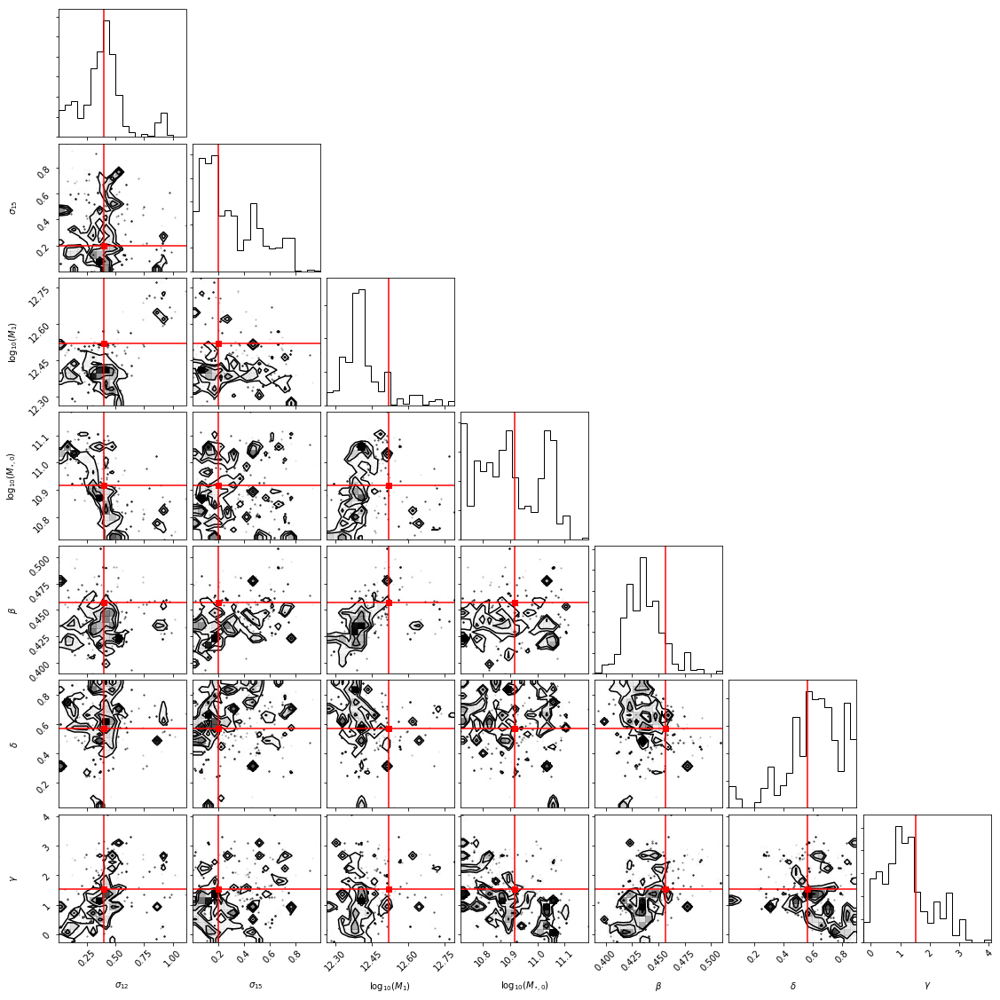

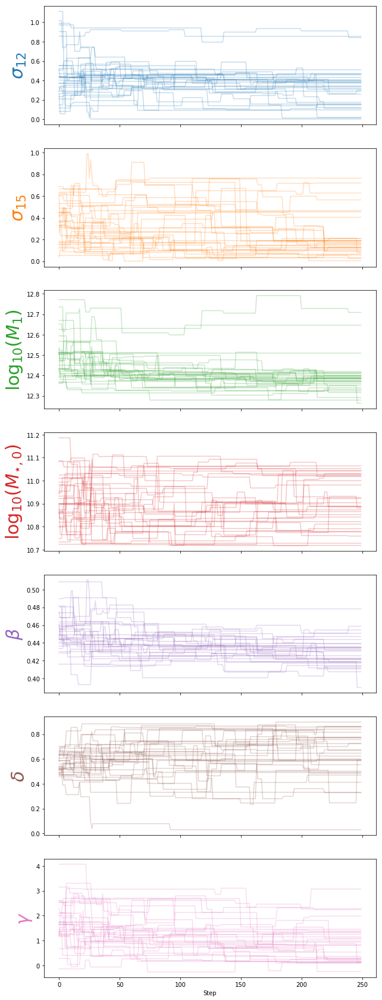

mock.populate
{u'smhm_beta_0': 0.4107699658232577, u'smhm_delta_0': 0.862808658628964, u'smhm_m0_0': 10.922234250482303, u'smhm_m1_a': 0, u'smhm_m0_a': 0, u'smhm_beta_a': 0, u'smhm_gamma_0': -0.24752502375431562, u'smhm_gamma_a': 0, u'smhm_m1_0': 12.291799230561029, u'scatter_model_param2': 0.17134841027909167, u'smhm_delta_a': 0, u'scatter_model_param1': 0.12046342370582197}
SMF computed
cut galaxies table 1643897
Ks_2sampResult(statistic=0.0017710555232370861, pvalue=1.0000000000000007)
DS computed


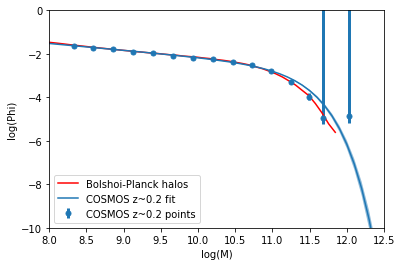

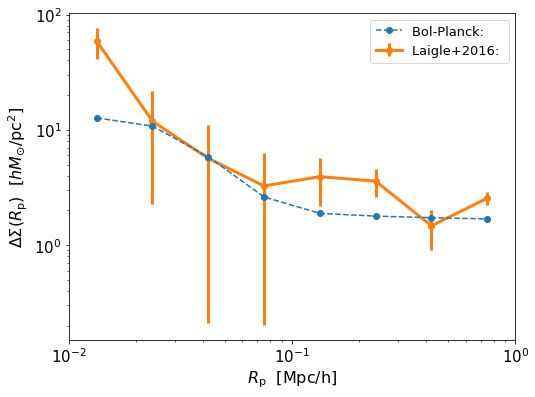

In [30]:
make_analysis_plots(5)

# run 5: SMF only 

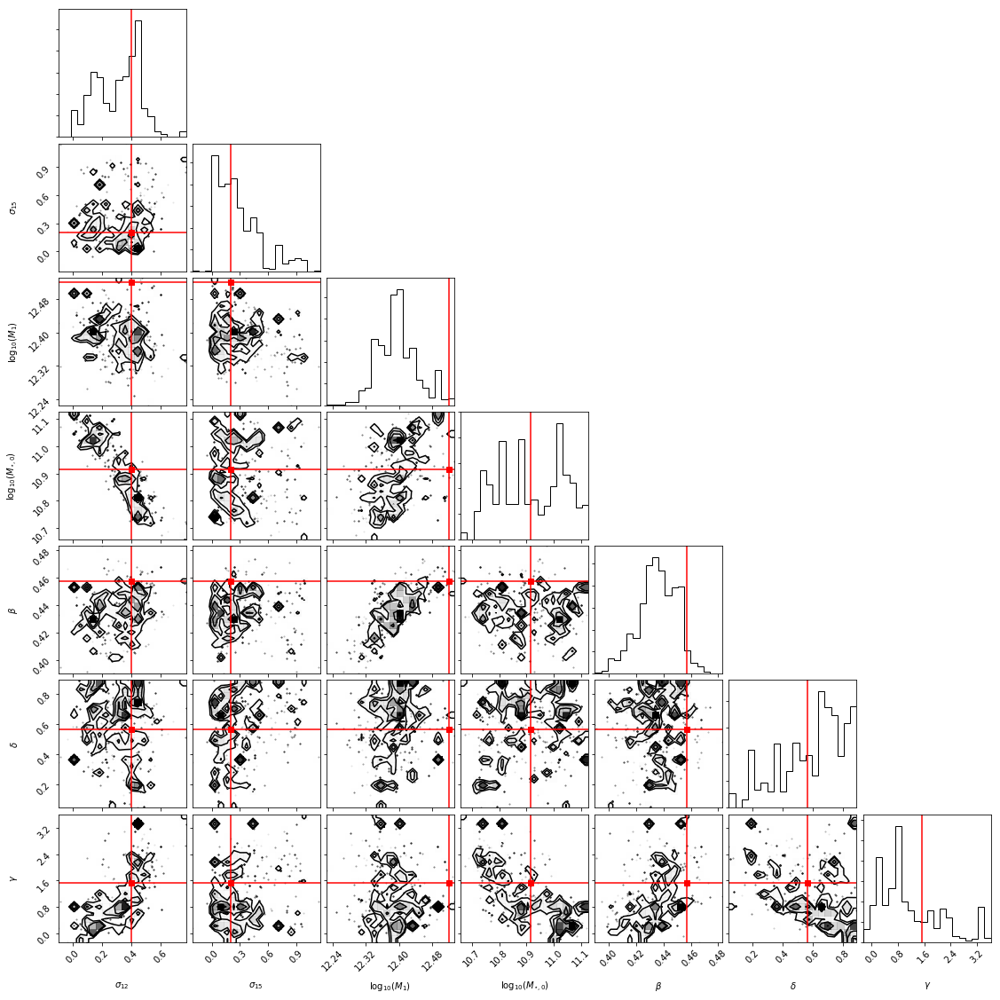

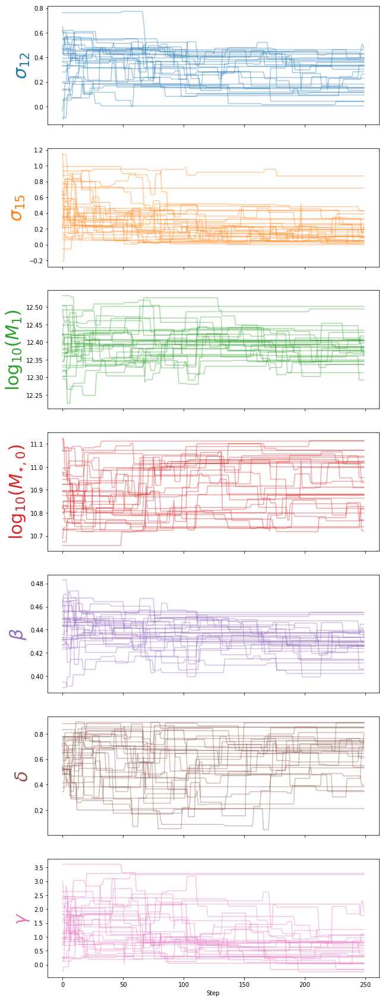

mock.populate
{u'smhm_beta_0': 0.4264954535204722, u'smhm_delta_0': 0.8868556809142754, u'smhm_m0_0': 11.023098246288642, u'smhm_m1_a': 0, u'smhm_m0_a': 0, u'smhm_beta_a': 0, u'smhm_gamma_0': -0.16949324387281606, u'smhm_gamma_a': 0, u'smhm_m1_0': 12.383398714008917, u'scatter_model_param2': 0.3890647113608149, u'smhm_delta_a': 0, u'scatter_model_param1': 0.04117138944836986}
SMF computed
cut galaxies table 1635747
Ks_2sampResult(statistic=0.0031575205222674763, pvalue=0.9999998730782207)
DS computed


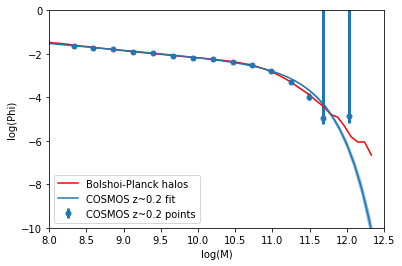

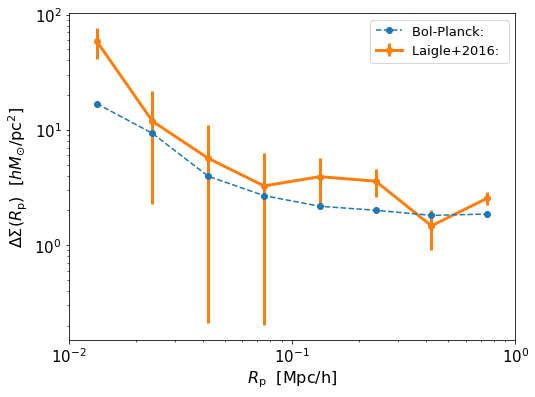

In [34]:
make_analysis_plots('5_SMFonly')

5SHMR+scatter


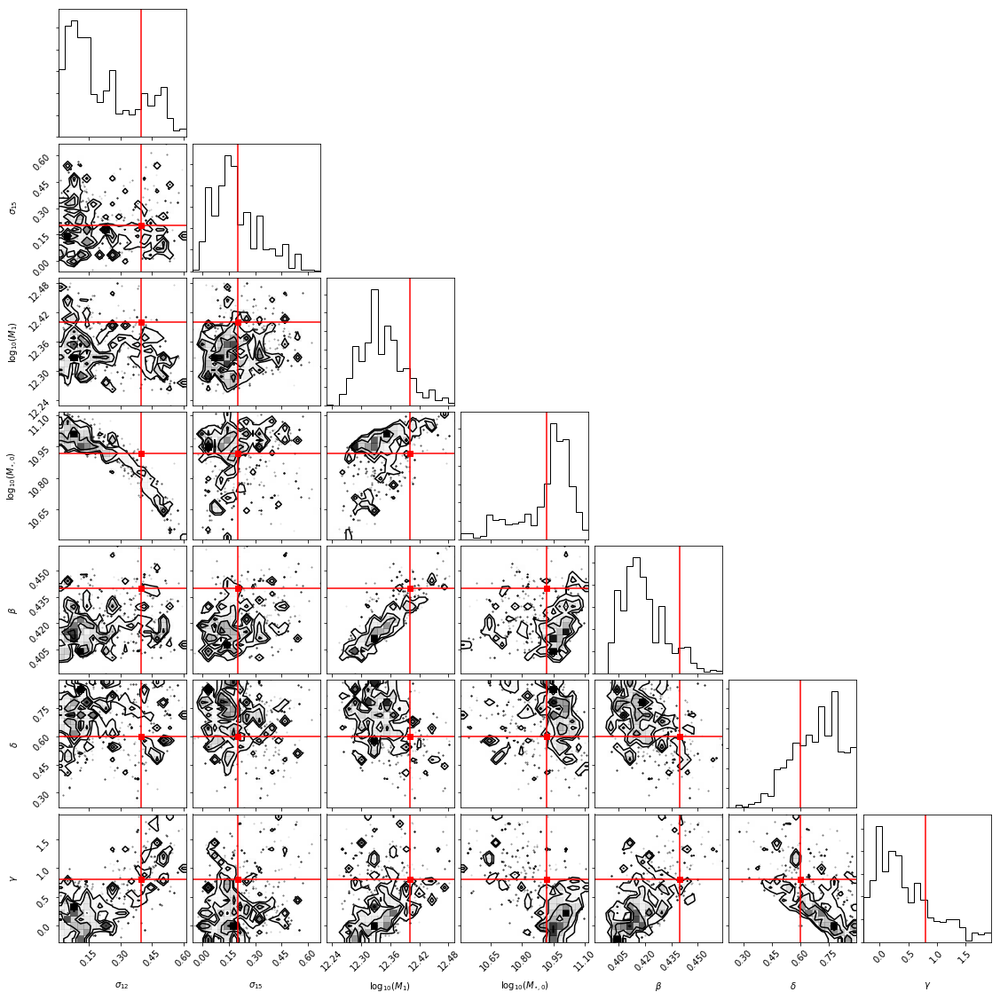

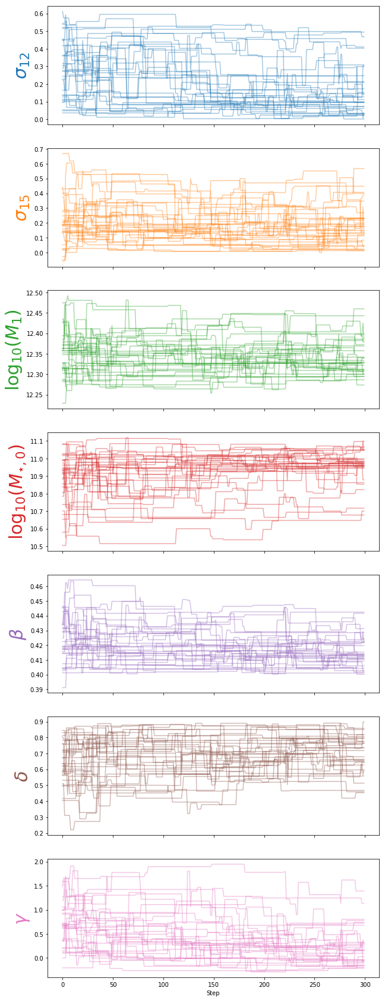

populate_mock
{u'smhm_beta_0': 0.4154854199768784, u'smhm_delta_0': 0.8080984921698663, u'smhm_m0_0': 10.973309348925147, u'smhm_m1_a': 0, u'smhm_m0_a': 0, u'smhm_beta_a': 0, u'smhm_gamma_0': -0.04619878516817938, u'smhm_gamma_a': 0, u'smhm_m1_0': 12.335082275898245, u'scatter_model_param2': 0.11116200626918585, u'smhm_delta_a': 0, u'scatter_model_param1': 0.10548781697508061}
SMF computed
cut galaxies table 1614099
Ks_2sampResult(statistic=0.0020069808027923797, pvalue=1.0000000000000002)
DS computed


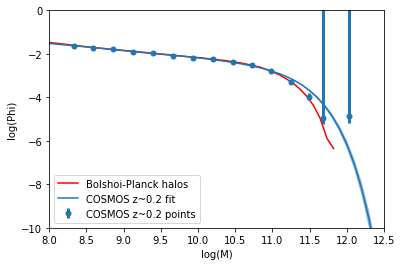

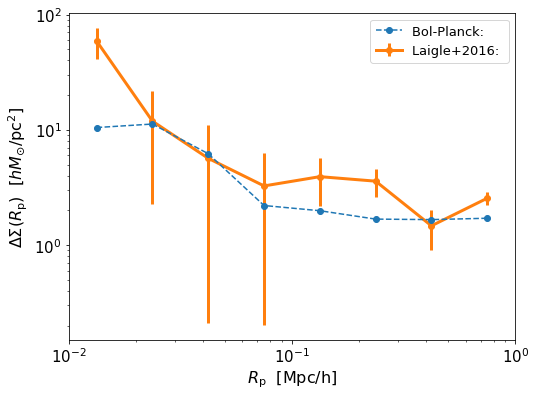

In [10]:
make_analysis_plots('6')

## testing new hdf5 outputs 

5SHMR+scatter (Vmax@Mpeak)
14 walkers
200 iterations so far


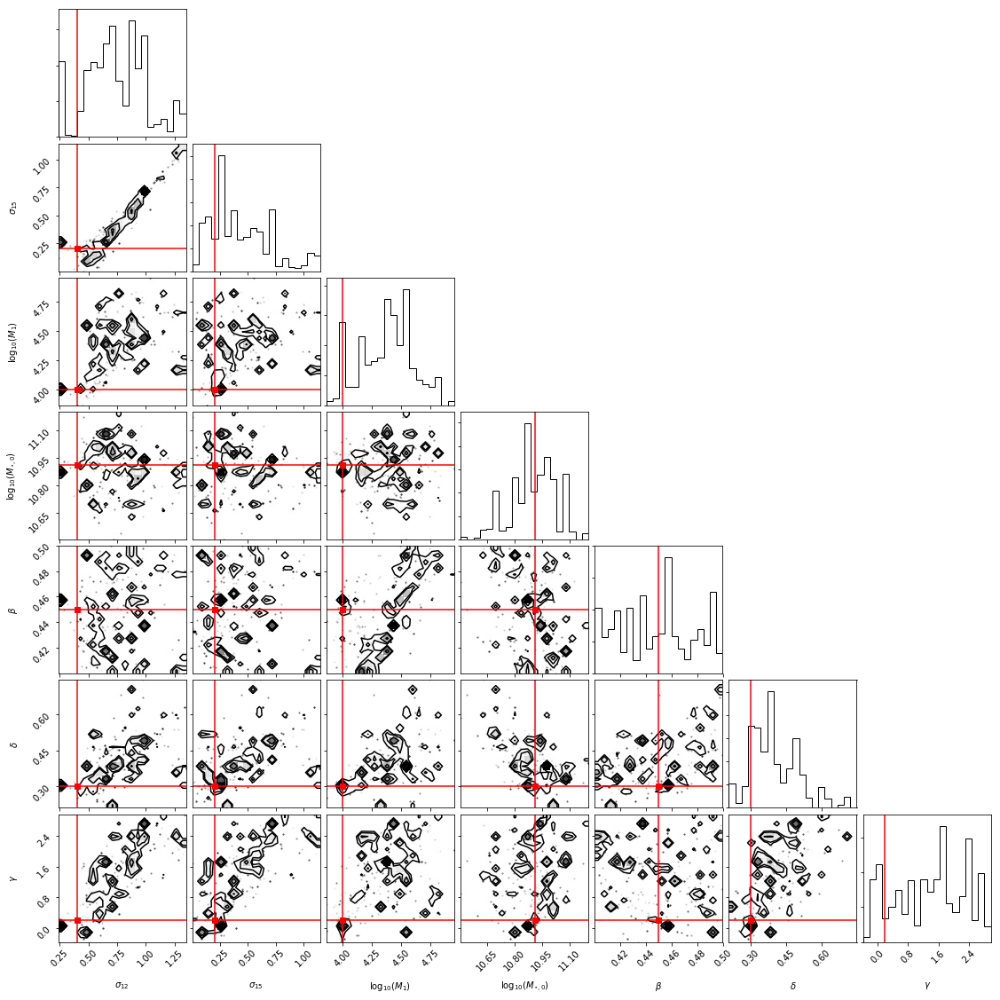

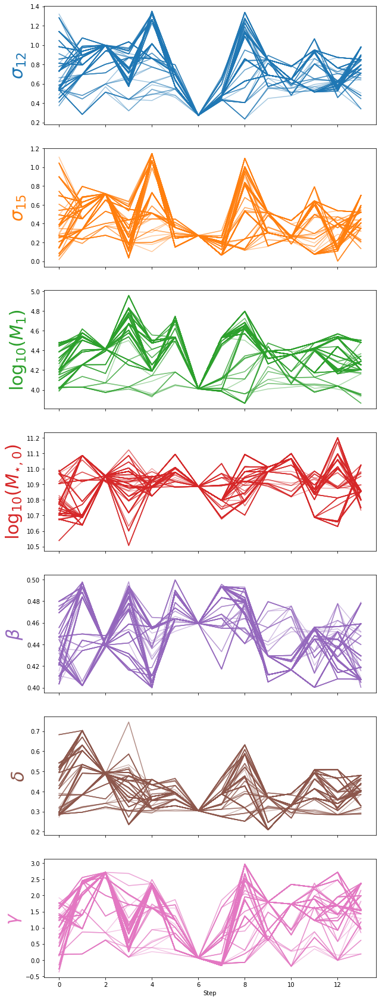

[ 0.9989842   0.71781105  4.41344472 10.95665574  0.43938101  0.4869684
  2.71676583]
USING CHRIS' CODE with halo_Vmax@Mpeak
SMF computed
cut galaxies table 1483873
Ks_2sampResult(statistic=0.0019617348587680494, pvalue=0.9999999999999999)
DS computed


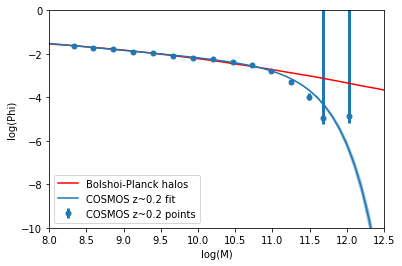

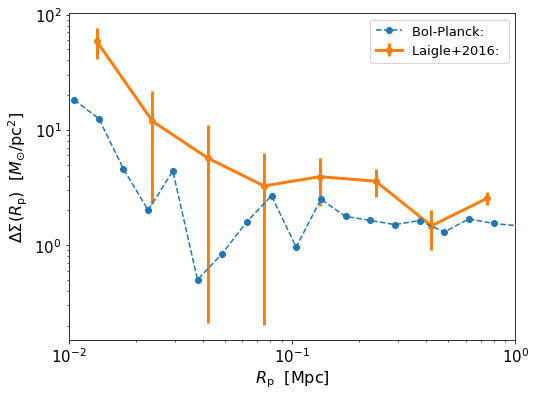

In [7]:
make_analysis_plots_hdf5('Vmax_1')

5SHMR+scatter (Vmax@Mpeak)
15 walkers
10000 iterations so far


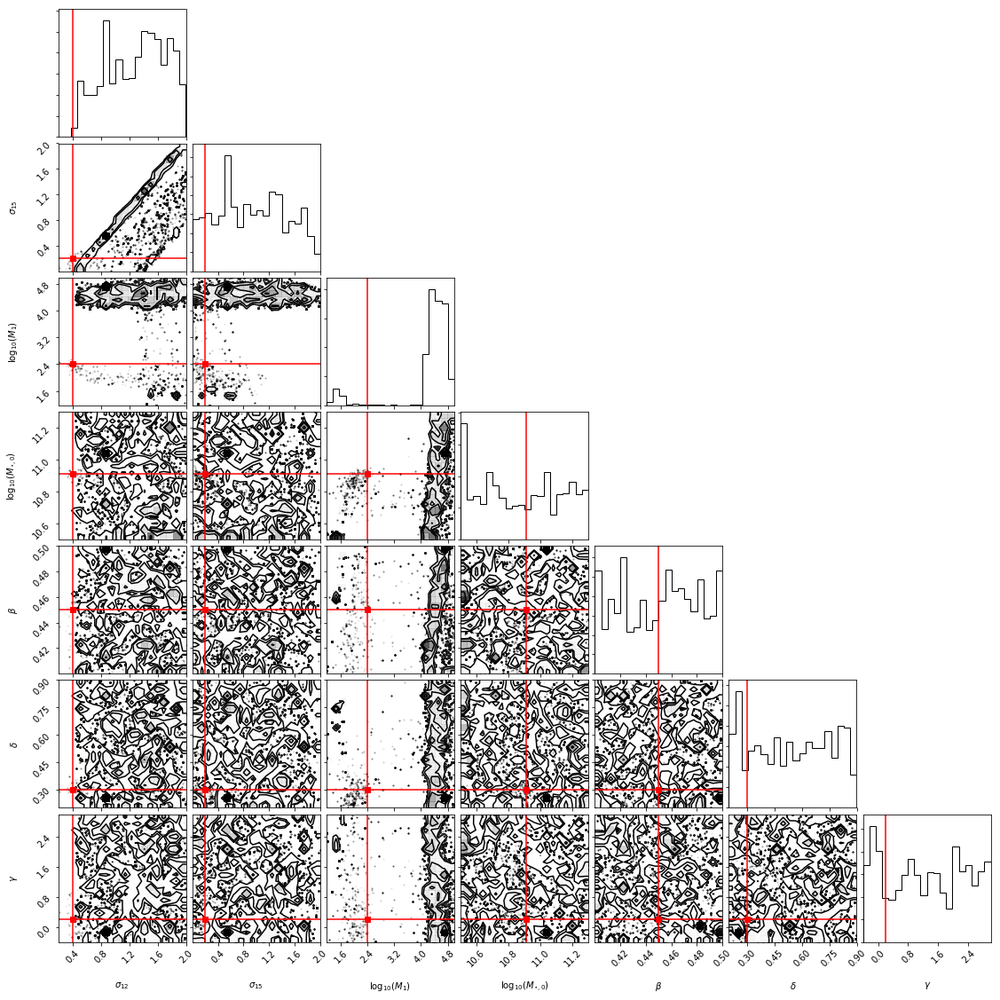

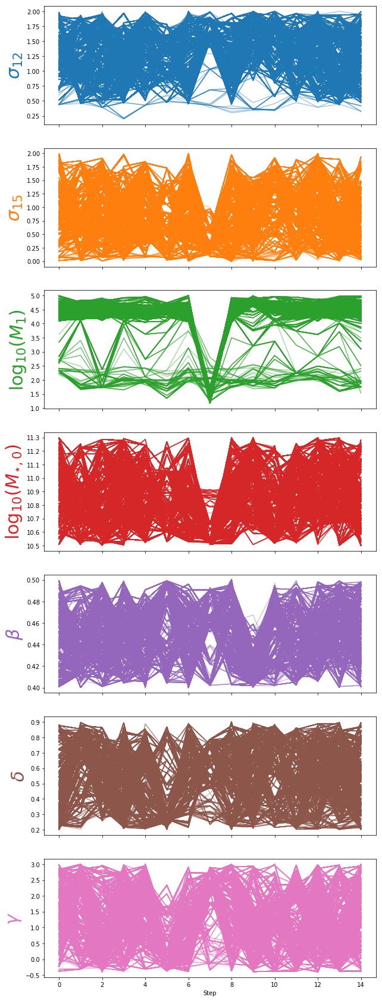

[ 0.86484256  0.5442994   4.51870019 10.88115948  0.46847305  0.76526875
  0.20537554]
USING CHRIS' CODE with halo_Vmax@Mpeak
SMF computed
cut galaxies table 1496266
Ks_2sampResult(statistic=0.0018373085127012523, pvalue=1.0)
DS computed


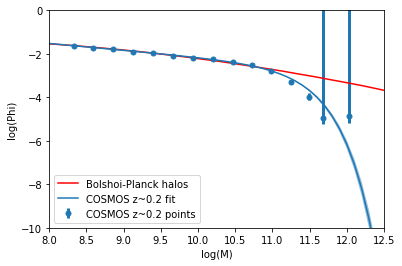

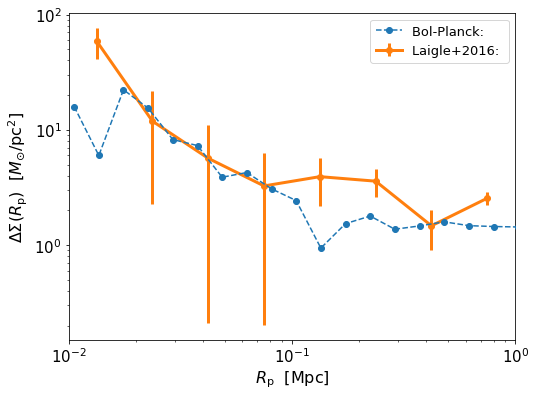

In [8]:
make_analysis_plots_hdf5('Vmax_2')

5SHMR+scatter (Vmax@Mpeak)
15 walkers
9715 iterations so far


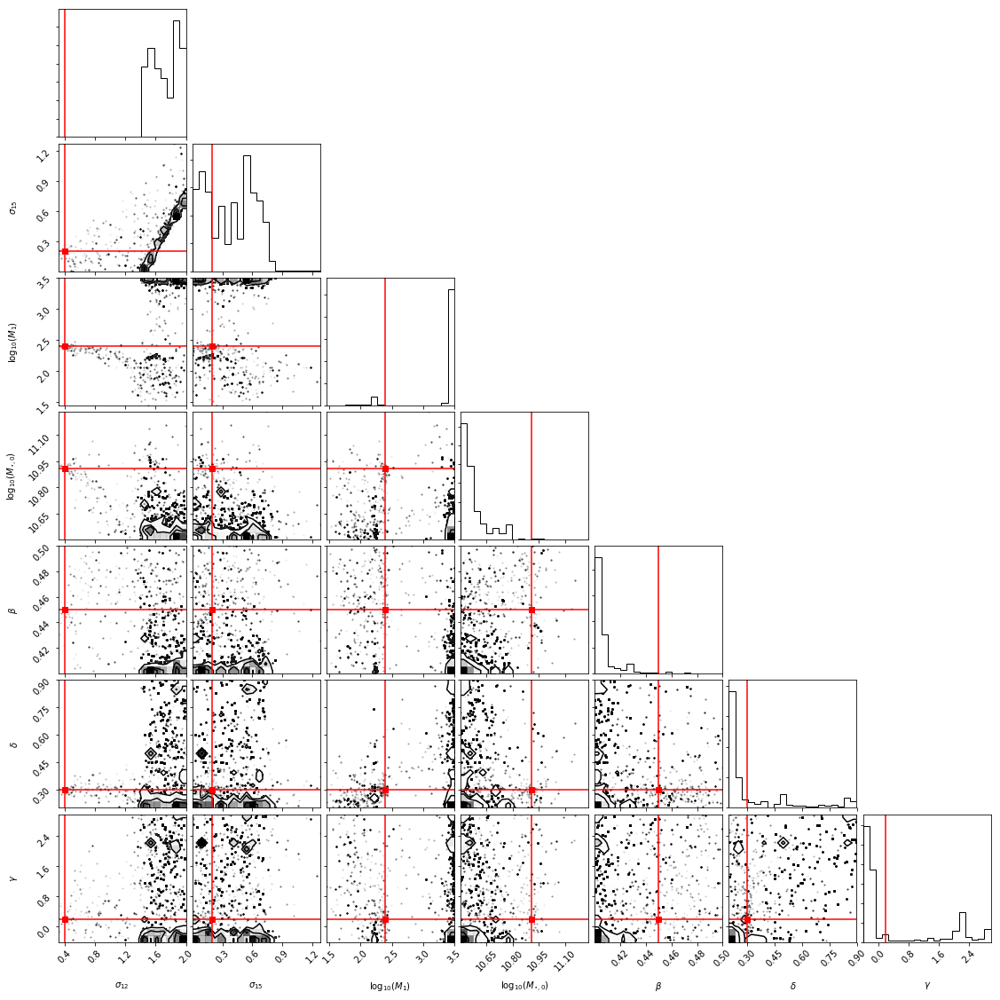

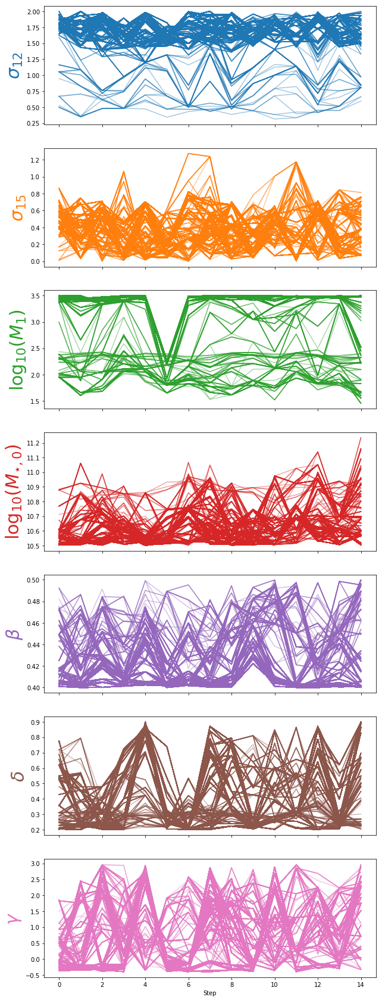

[ 1.51954713  0.1317508   3.49256239 10.50650919  0.40232937  0.21869973
 -0.21392235]
USING CHRIS' CODE with halo_Vmax@Mpeak
SMF computed
cut galaxies table 1004246
Ks_2sampResult(statistic=0.006533399645583748, pvalue=0.9329280372760683)
Mock and COSMOS distributions don't match!
DS computed


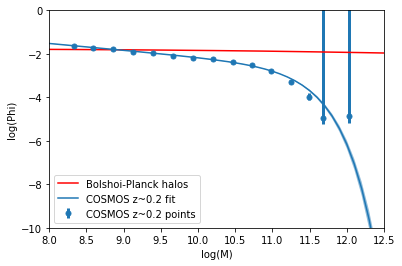

/Users/fardila/anaconda2/envs/dwarf_lensing/lib/python2.7/site-packages/matplotlib/ticker.py:2207: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  "Data has no positive values, and therefore cannot be "


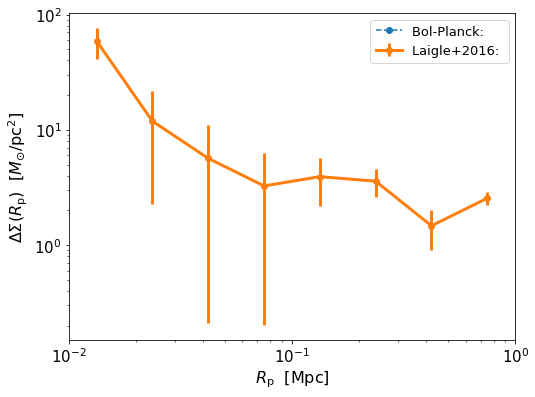

In [5]:
make_analysis_plots_hdf5('Vmax_3')

5SHMR+scatter (Vmax@Mpeak)
15 walkers
1238 iterations so far


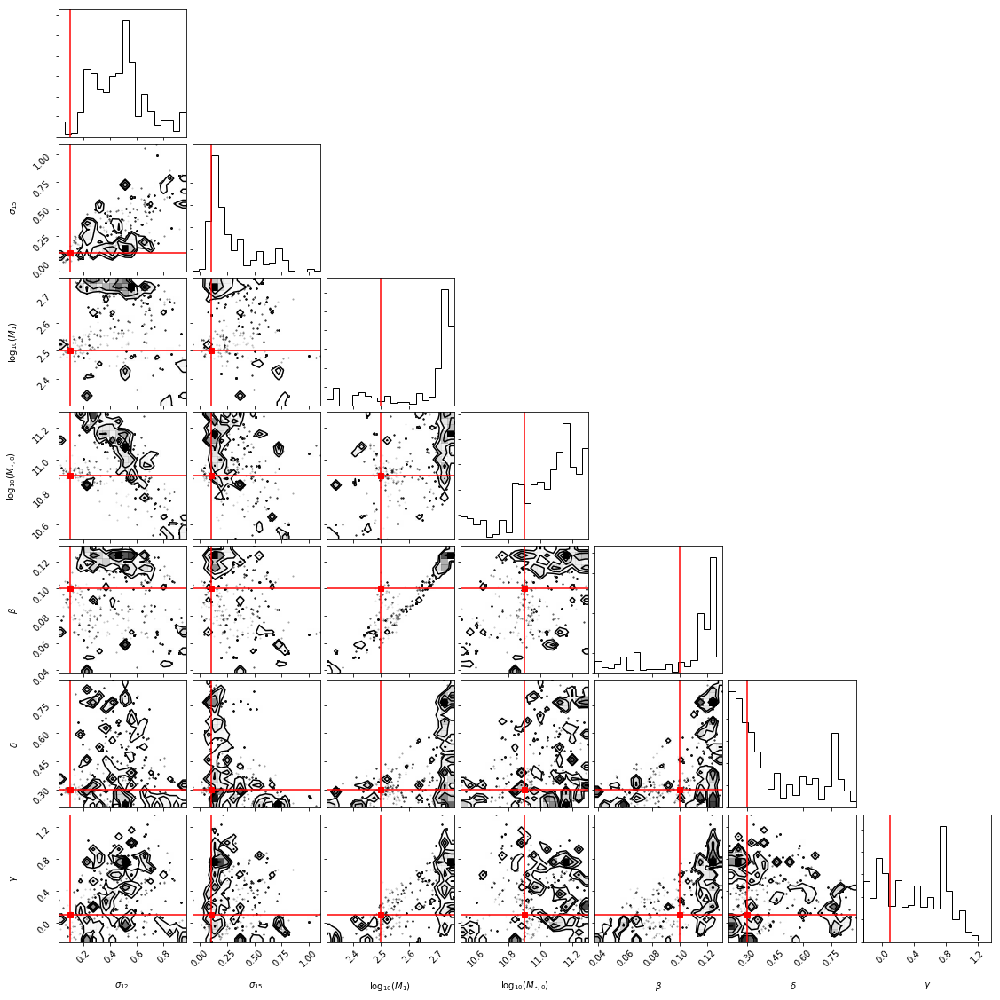

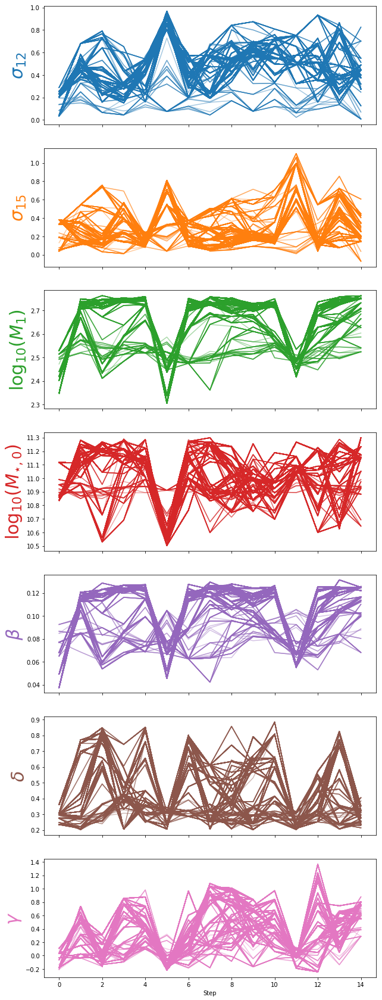

[ 0.39668123  0.12429766  2.72664318 11.11370387  0.1197259   0.6324251
  0.32319428]
USING CHRIS' CODE with halo_Vmax@Mpeak
SMF computed
cut galaxies table 1602114
Ks_2sampResult(statistic=0.0017888307155322636, pvalue=1.0000000000000002)
DS computed


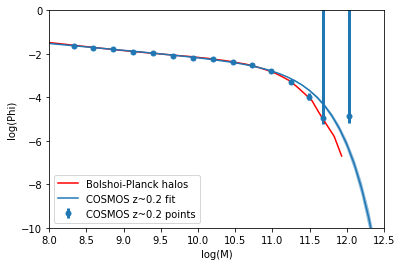

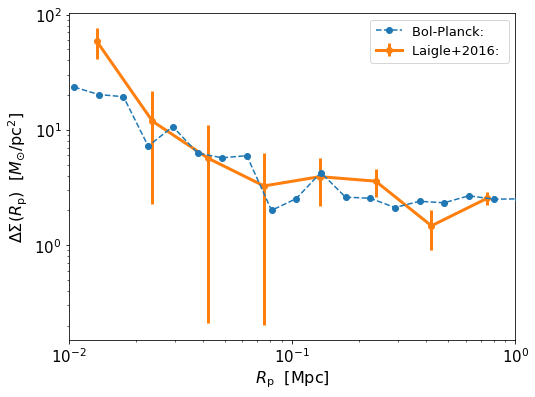

In [4]:
make_analysis_plots_hdf5('Vmax_4')

5SHMR+scatter (Vmax@Mpeak)
15 walkers
10000 iterations so far


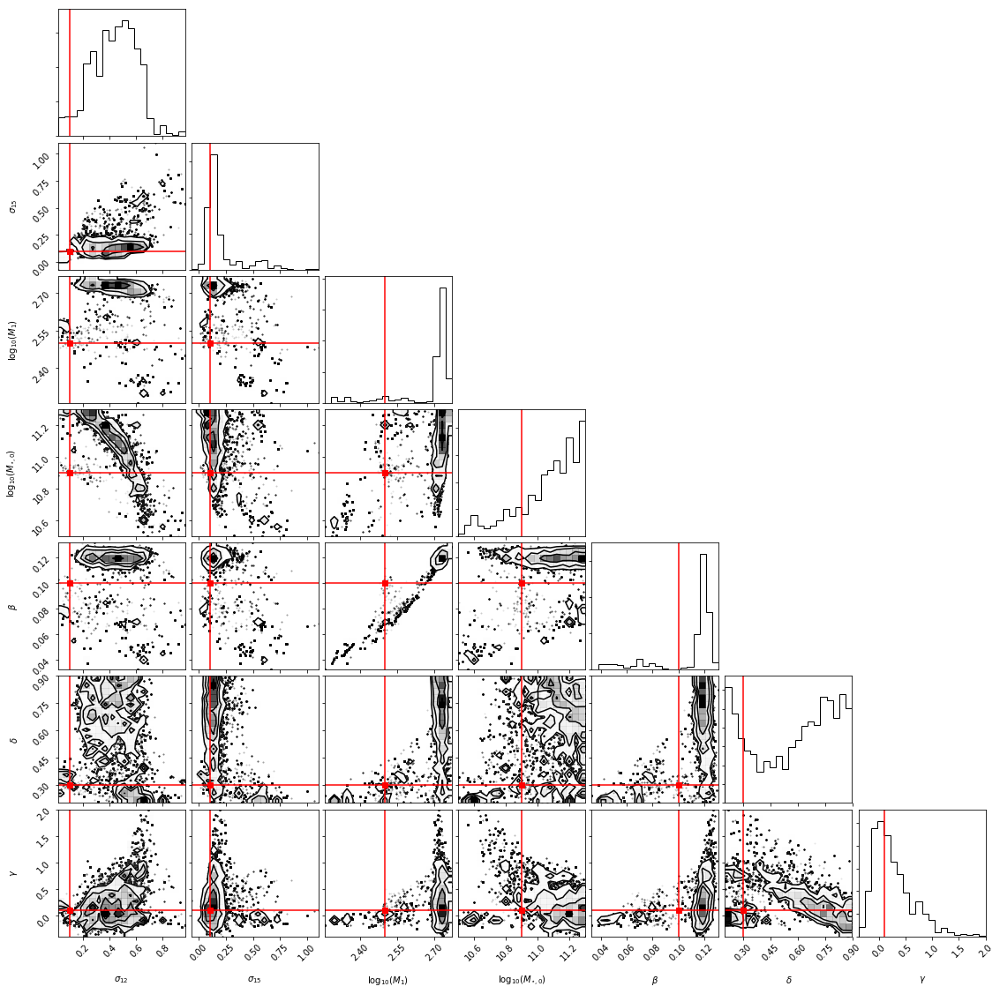

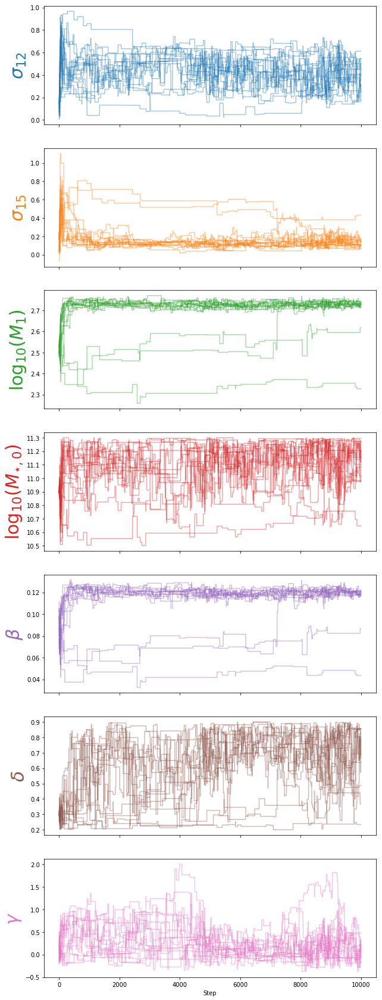

[ 0.50720583  0.10804912  2.7246083  11.02051593  0.11966145  0.8532043
  0.02996565]
USING CHRIS' CODE with halo_Vmax@Mpeak
SMF computed
cut galaxies table 1587603
Ks_2sampResult(statistic=0.00208131342511797, pvalue=1.0000000000000002)
DS computed


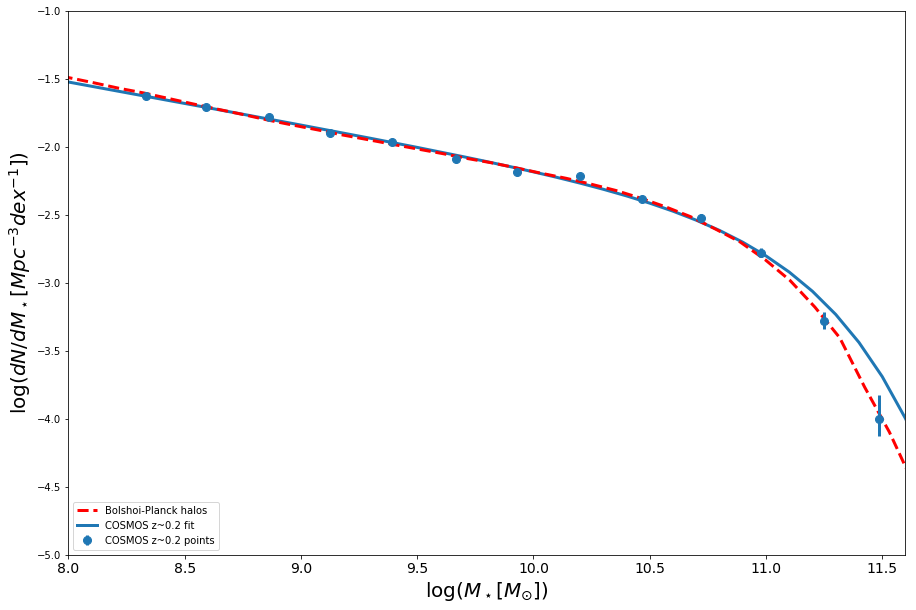

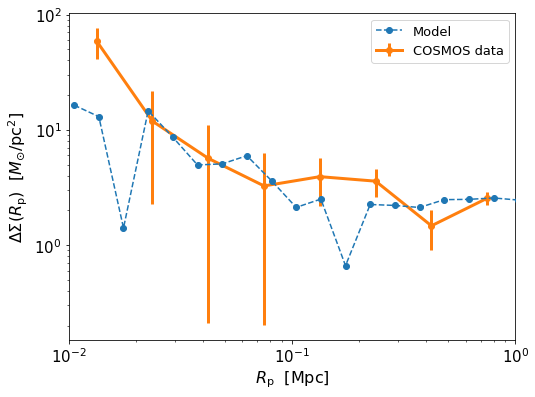

NameError: global name 'plot_sigma_slope' is not defined

In [10]:
make_analysis_plots_hdf5('Vmax_4')

5SHMR+scatter (Vmax@Mpeak)
15 walkers
3144 iterations so far


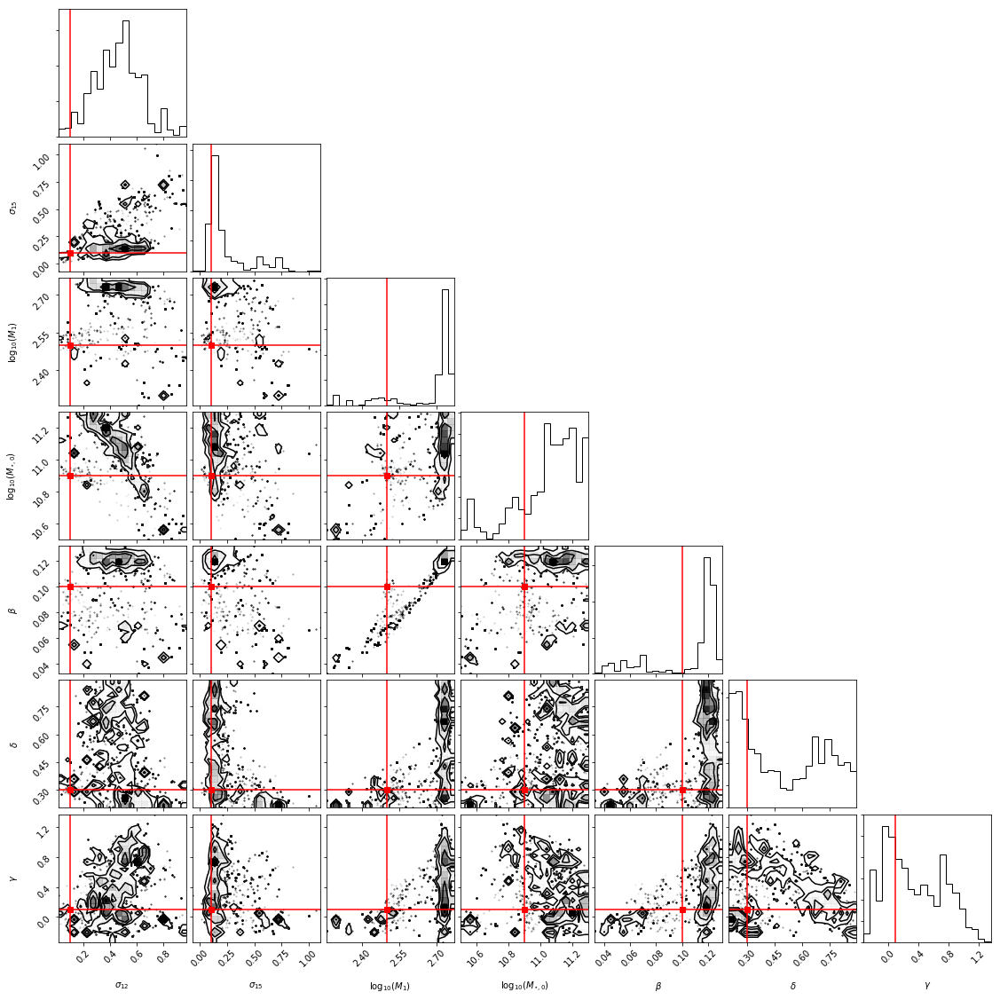

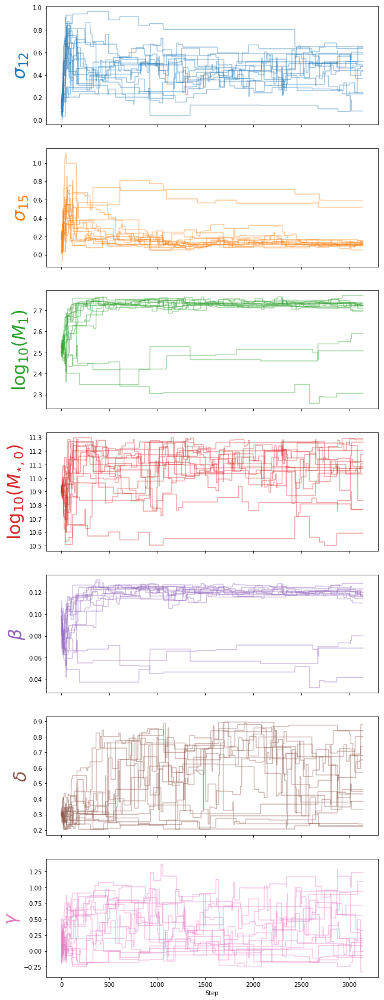

[ 0.53903687  0.11330591  2.72161542 11.01133551  0.11815845  0.70730249
  0.28967114]
USING CHRIS' CODE with halo_Vmax@Mpeak
SMF computed
cut galaxies table 1563777
Ks_2sampResult(statistic=0.001952039299334296, pvalue=1.0)
DS computed


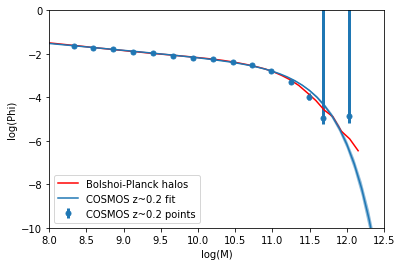

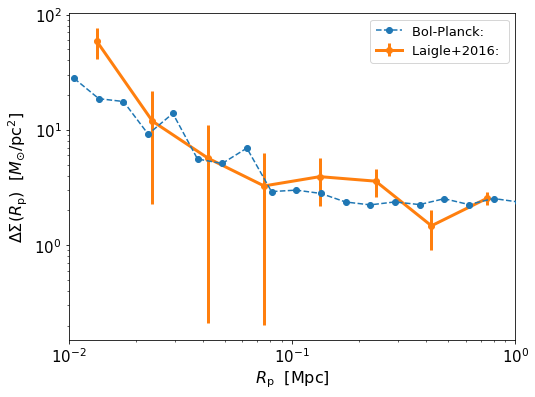

In [13]:
make_analysis_plots_hdf5('Vmax_4')

## plotting sigma slopes 

In [14]:
tau = np.array([675.47352881, 690.18577071, 524.94131853, 694.14454168, 510.75972428,
                850.77800837, 764.58697294])
print(50*np.sum(tau))

235543.493266


burn-in: 4000
thin: 1
15 walkers
10000 iterations per walker so far (150000 total)
90000 iterations being used total


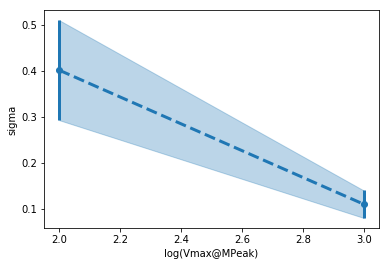

In [43]:
run='Vmax_4'
plot_sigma_slope(run)

## create 5 samples with best fit params 

In [8]:
best_params = [ 0.53903687,  0.11330591,  2.72161542, 11.01133551,  0.11815845,  0.70730249,  0.28967114]

3.0rc1
3.0rc1


3.0rc1
3.0rc1
USING CHRIS' CODE with halo_Vmax@Mpeak
SMF computed
cut galaxies table 1561453
Ks_2sampResult(statistic=0.0020134445090814745, pvalue=1.0)
DS computed


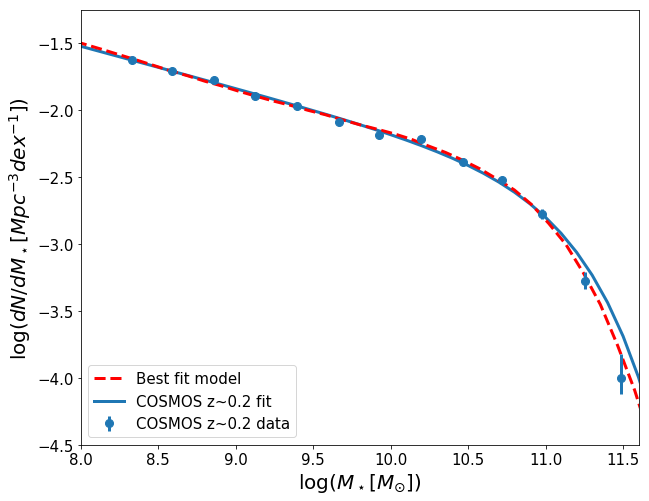

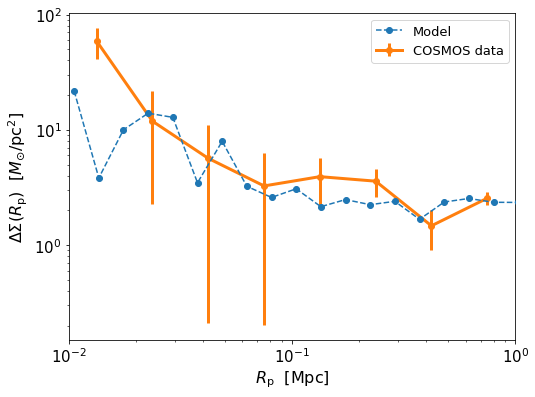

In [19]:
plot_from_params(best_params, config, cosmos_data, sim_data)
plt.show()

cut galaxies table 1563488
Ks_2sampResult(statistic=0.0020328356279490922, pvalue=0.9999999999999999)


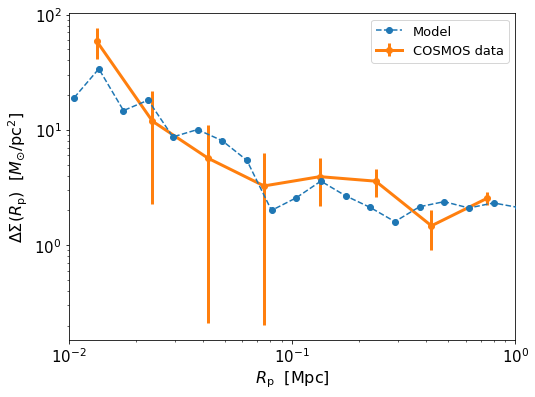

In [143]:
stellar_masses = get_chris_stellar_masses(best_params, config, sim_data)
# Predict DeltaSigma profiles
wl_r, wl_ds = compute_deltaSigma(stellar_masses, config, cosmos_data, sim_data)
plot_deltaSigma(cosmos_data['cosmos_wl_table'], wl_r, wl_ds)

cut galaxies table 1562964
Ks_2sampResult(statistic=0.0021071682502746825, pvalue=1.0000000000000002)


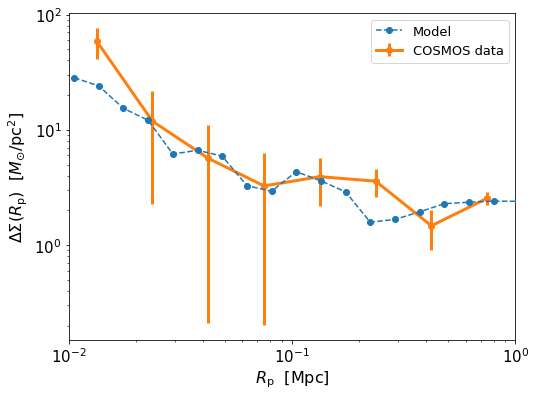

cut galaxies table 1562189
Ks_2sampResult(statistic=0.0019391118867558843, pvalue=0.9999999999999999)


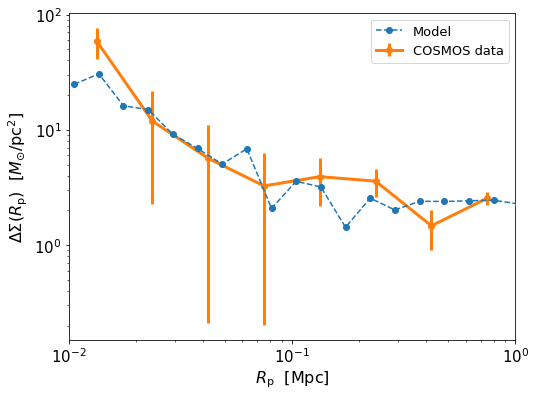

cut galaxies table 1561050
Ks_2sampResult(statistic=0.0020942408376963817, pvalue=1.0000000000000002)


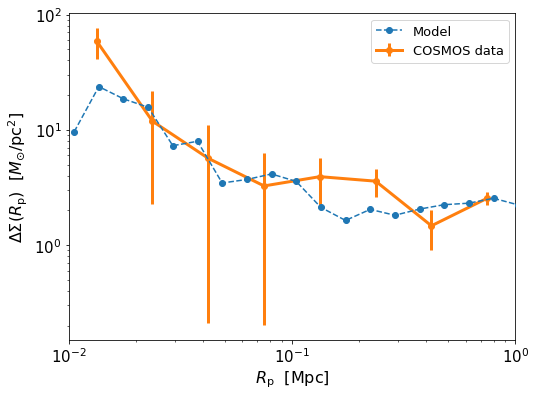

cut galaxies table 1564515
Ks_2sampResult(statistic=0.002045763040527504, pvalue=1.0000000000000002)


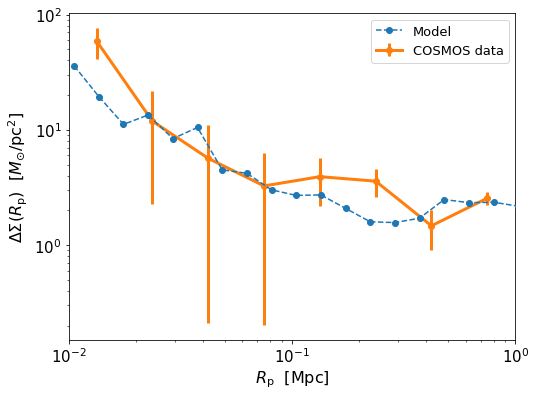

cut galaxies table 1562659
Ks_2sampResult(statistic=0.0020845452782626284, pvalue=0.9999999999999998)


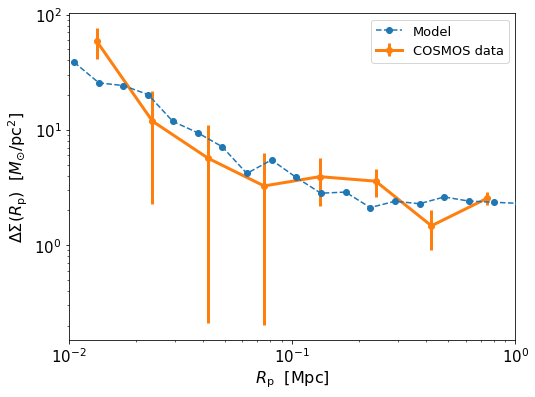

In [150]:
for i in range(5):
    stellar_masses = get_chris_stellar_masses(best_params, config, sim_data)
    # Predict DeltaSigma profiles
    wl_r, wl_ds = compute_deltaSigma(stellar_masses, config, cosmos_data, sim_data)
    plot_deltaSigma(cosmos_data['cosmos_wl_table'], wl_r, wl_ds)
    np.savetxt('model_WL_profile_{0}.txt'.format(str(i)), np.c_[wl_r,wl_ds])

# New Runs

In [17]:
burnin = 1
thin = 1

def make_analysis_plots_hdf5(run):
    config = parse_config('/Users/fardila/Documents/GitHub/dwarf_lensing/MCMC/config/mcmc_config_{0}.yaml'.format(str(run)))
    config, cosmos_data, sim_data = initial_model(config)
    
    file_name = '/Users/fardila/Documents/GitHub/dwarf_lensing/MCMC/outfiles/cosmos_bplanck_run_{0}.hdf5'.format(str(run))
    reader = emcee.backends.HDFBackend(file_name)

    chains = reader.get_chain()
    log_prob = reader.get_log_prob()
    
    print("burn-in: {0}".format(burnin))
    print("thin: {0}".format(thin))
    print('{0} walkers'.format(chains.shape[1]))
    print('{0} iterations per walker so far ({1} total)'.format(chains.shape[0],
                                                                chains.shape[0]*chains.shape[1]))
    
    #step plots
    f, axes = plt.subplots(7, 1, sharex=True, figsize=[10,30])

    for i, parameter in enumerate(chains.T):
        for walker in parameter:
            axes[i].plot(range(len(walker)), walker, color=new_colors[i], alpha=0.4)
            axes[i].set_ylabel(config['param_labels_latex'][i], color=new_colors[i], fontsize=30)
        axes[i].axvline(burnin, c='r')
    plt.xlabel('Step') 
    plt.show()
                         
    #plot best
    samples = np.concatenate(chains, axis=0) #concatenate chains (i.e. flatten array)
    best_params = samples[np.argmax(log_prob, axis=None)]
    print(best_params)
    plot_from_params(best_params, config, cosmos_data, sim_data)  
    
    #####
    #Discard burnin for corner plot
    ####
    samples = reader.get_chain(discard=burnin, flat=True, thin=thin)
    log_prob = reader.get_log_prob(discard=burnin, flat=True, thin=thin)
    print('{0} iterations being used total'.format(samples.shape[0]))
    
                       
    #corner plot
    if config['fixed_scatter']: #if fixed value there is not enough dynamic range for contours and error is raised
        samples = samples.T[2:].T
        labels = config['param_labels_latex'][2:]
        truths=config['param_ini'][2:]
    else:
        labels = config['param_labels_latex']
        truths=config['param_ini']

    fig = corner.corner(samples, labels=labels,
                      truths=truths, truth_color='r')
    plt.show()
         

    #plot scatter dependance
    plot_sigma_slope(run)
    
    plt.show()
                         
    return

def weighted_avg_and_std(values, weights):
    """
    Return the weighted average and standard deviation.

    values, weights -- Numpy ndarrays with the same shape.
    """
    average = np.average(values, weights=weights)
    # Fast and numerically precise:
    variance = np.average((values-average)**2, weights=weights)
    return (average, math.sqrt(variance))


def plot_sigma_slope(run):
    
    file_name = '/Users/fardila/Documents/GitHub/dwarf_lensing/MCMC/outfiles/cosmos_bplanck_run_{0}.hdf5'.format(str(run))
    reader = emcee.backends.HDFBackend(file_name)
    
#     tau = reader.get_autocorr_time()
#     burnin = int(2*np.max(tau))
#     thin = int(0.5*np.min(tau))


    chains = reader.get_chain()
    log_prob = reader.get_log_prob()
    
    print("burn-in: {0}".format(burnin))
    print("thin: {0}".format(thin))
    print('{0} walkers'.format(chains.shape[1]))
    print('{0} iterations per walker so far ({1} total)'.format(chains.shape[0],
                                                                chains.shape[0]*chains.shape[1]))
    
    chains = reader.get_chain(discard=burnin, flat=True, thin=thin)
    log_prob = reader.get_log_prob(discard=burnin, flat=True, thin=thin)
    print('{0} iterations being used total'.format(chains.shape[0]))

    #only first 2 params
    sigma_2, sigma_3 =  chains.T[:2]

#     #flatten walker chains together
#     sigma_2_flat, sigma_3_flat = sigma_2.T.flatten(), sigma_3.T.flatten()
    
    #choose points to interpolate
    interp_Vs = np.linspace(2,3,30)
    interp_sigmas = [np.interp(interp_Vs, [2,3], [sigma2, sigma3]) for sigma2, sigma3 in zip(sigma_2, sigma_3)]
    
    #get means and sigmas
    means, stds = [], []
    for i, V in enumerate(interp_Vs):
        samples = [sigmas[i] for sigmas in interp_sigmas]
        mean, std = weighted_avg_and_std(samples, np.exp(log_prob))

        means.append(mean)
        stds.append(std)
        
    means = np.array(means)
    stds = np.array(stds)
        
    #plot
    fig, axes=plt.subplots(1,1, figsize=[6,6])
    
    #left subplot: Vmax@Mpeak
#     axes.errorbar(interp_Vs, means,yerr=stds,
#             c=plt.get_cmap('tab20')(0), linewidth=3, linestyle='--', marker='o', label = 'model')
    axes.plot(interp_Vs, means, c=plt.get_cmap('tab20')(0), linewidth=3, linestyle='--', label = 'model')
    axes.fill_between(interp_Vs, means+stds, means-stds,
                     color=plt.get_cmap('tab20')(0), alpha=0.3)
    axes.fill_between(interp_Vs, means+2*stds, means-2*stds,
                     color=plt.get_cmap('tab20')(0), alpha=0.2)

    axes.set_xlabel(r'$\log(V_{max}@M_{peak}$)', fontsize=25)
    axes.set_ylabel(r'$\sigma_{M_* | V_{max}@M_{peak}}$', fontsize=25)
    axes.legend()
    

    plt.show()

5SHMR+scatter (Vmax@Mpeak)
burn-in: 1
thin: 1
15 walkers
12229 iterations per walker so far (183435 total)


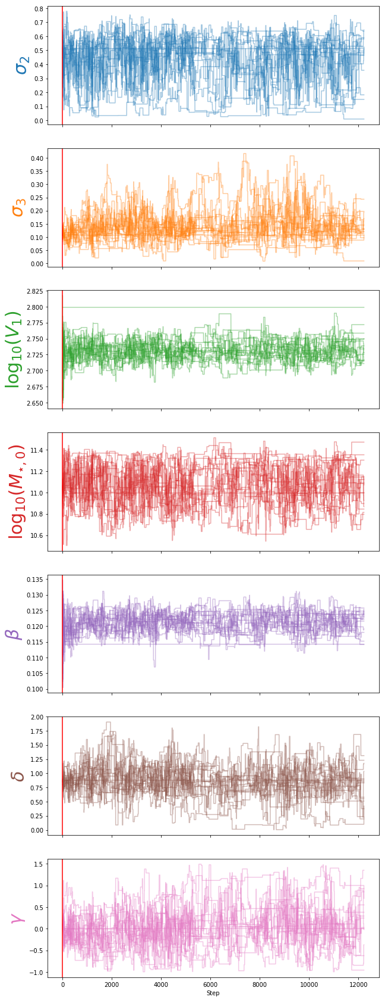

183420 iterations being used total


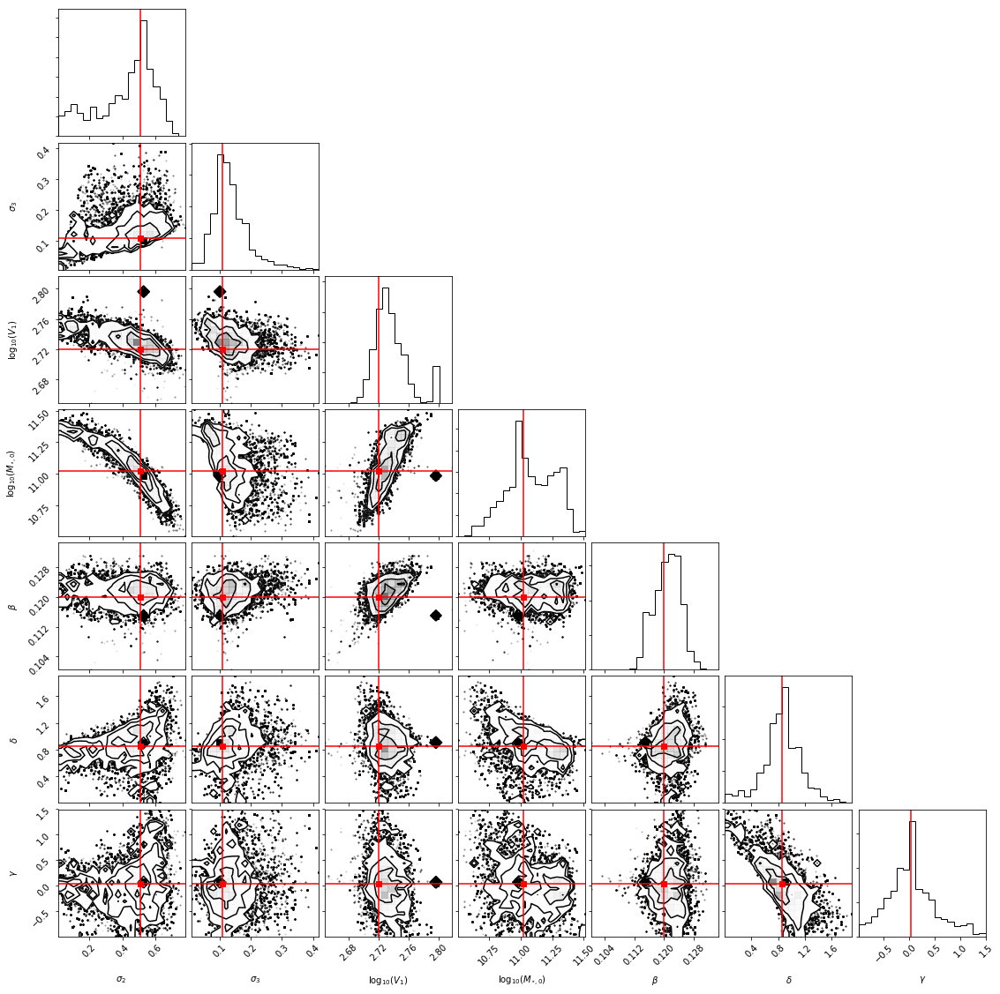

[ 0.48418425  0.11010146  2.72603396 11.03541275  0.11999312  0.90875961
 -0.01469141]
USING CHRIS' CODE with halo_Vmax@Mpeak
SMF computed
cut galaxies table 1583031
Ks_2sampResult(statistic=0.002103936397130135, pvalue=0.9999999999999999)
DS computed


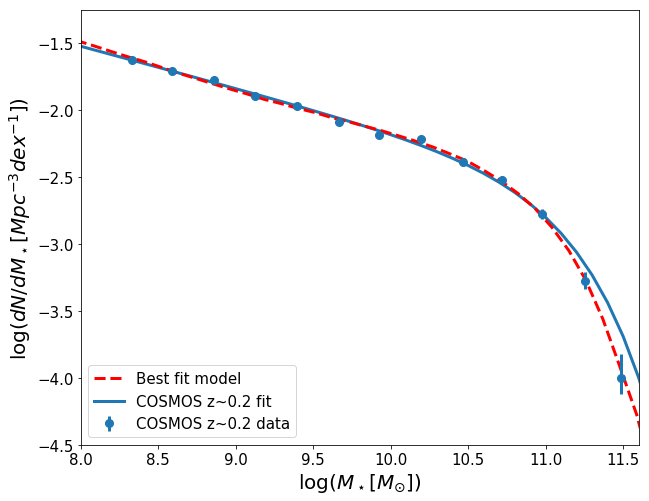

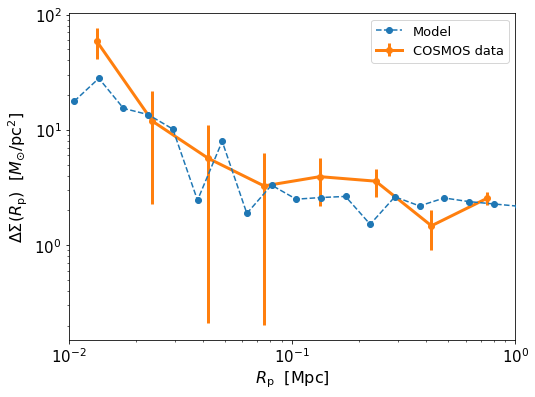

burn-in: 1
thin: 1
15 walkers
12230 iterations per walker so far (183450 total)
183435 iterations being used total


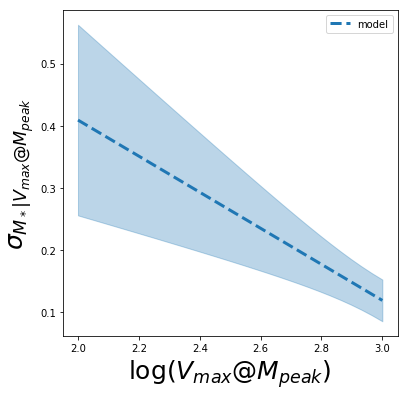

In [6]:
make_analysis_plots_hdf5('Vmax_5')

5SHMR+scatter (Vmax@Mpeak)
burn-in: 1
thin: 1
15 walkers
4913 iterations per walker so far (73695 total)


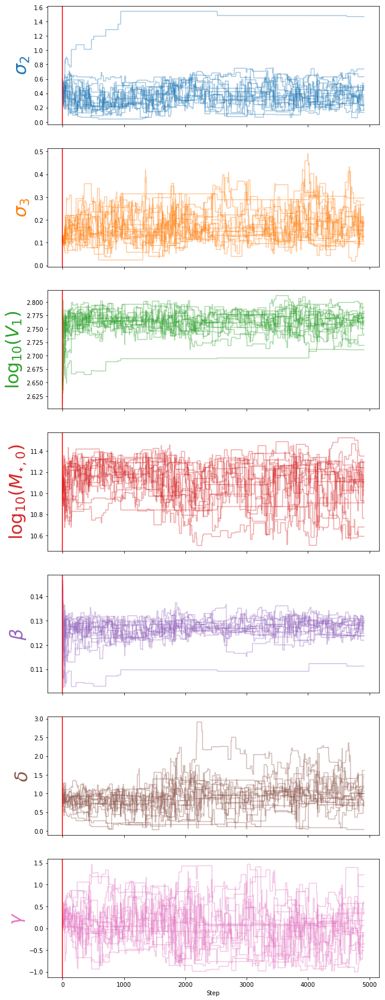

73680 iterations being used total


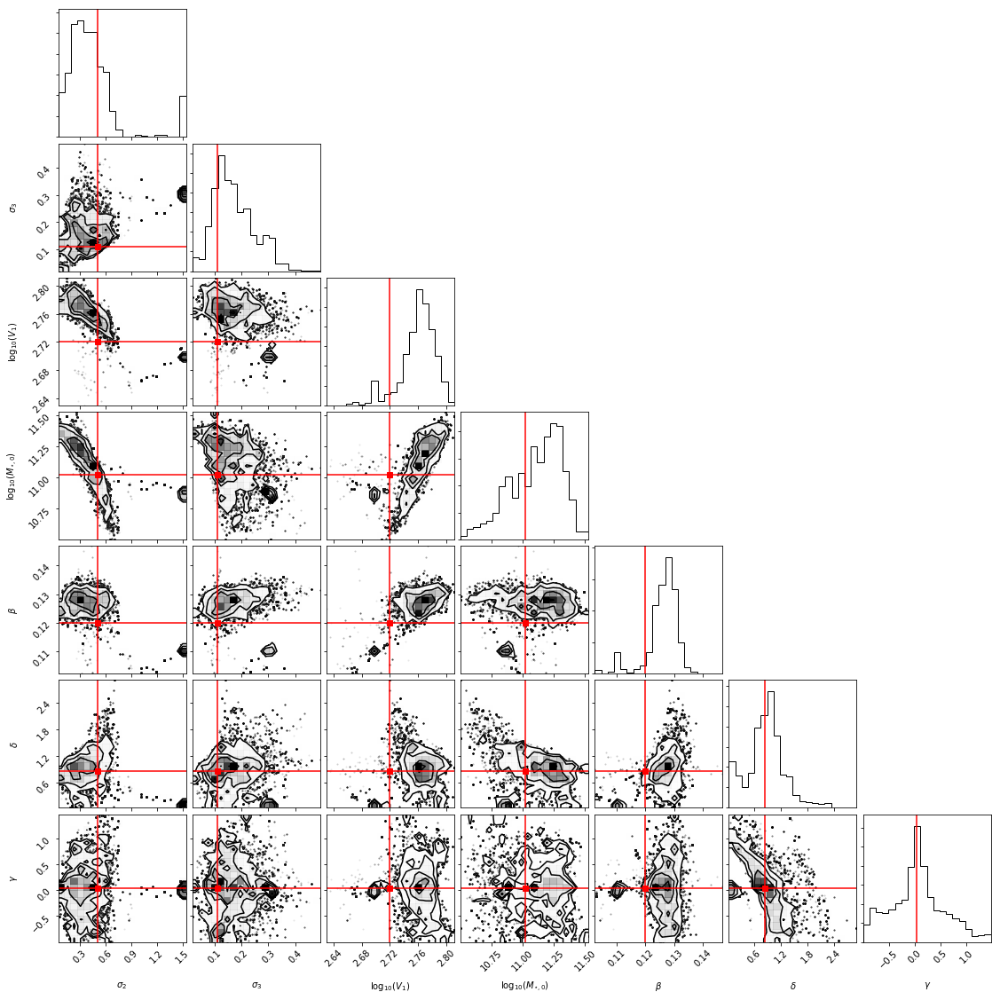

[ 0.31778976  0.16864865  2.76285812 11.15042856  0.12689323  0.96288237
 -0.03033116]
USING CHRIS' CODE with halo_Vmax@Mpeak
SMF computed
cut galaxies table 1577514
Ks_2sampResult(statistic=0.001879322603580924, pvalue=1.0000000000000004)
DS computed


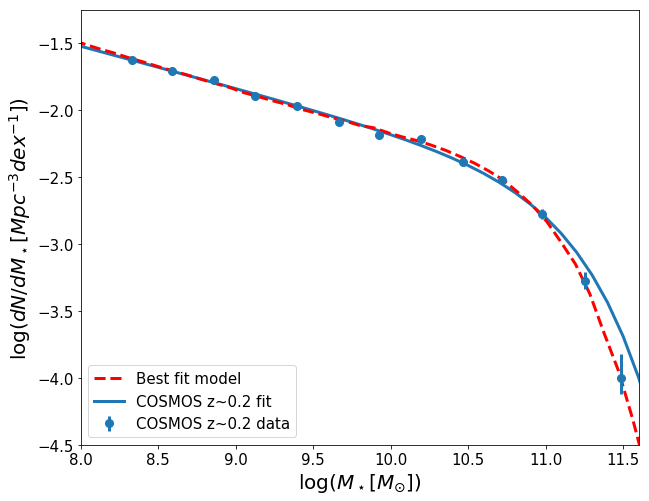

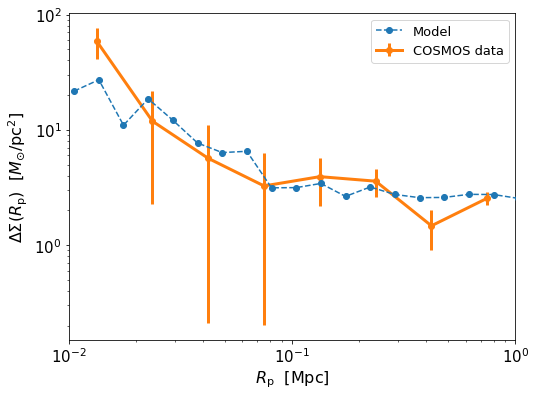

burn-in: 1
thin: 1
15 walkers
4914 iterations per walker so far (73710 total)
73695 iterations being used total


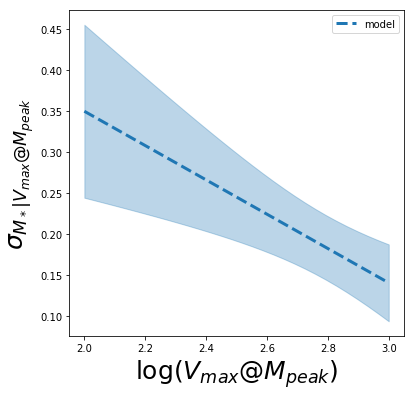

In [4]:
make_analysis_plots_hdf5('UM_1')

5SHMR+scatter (Vmax@Mpeak)
burn-in: 1
thin: 1
15 walkers
1015 iterations per walker so far (15225 total)


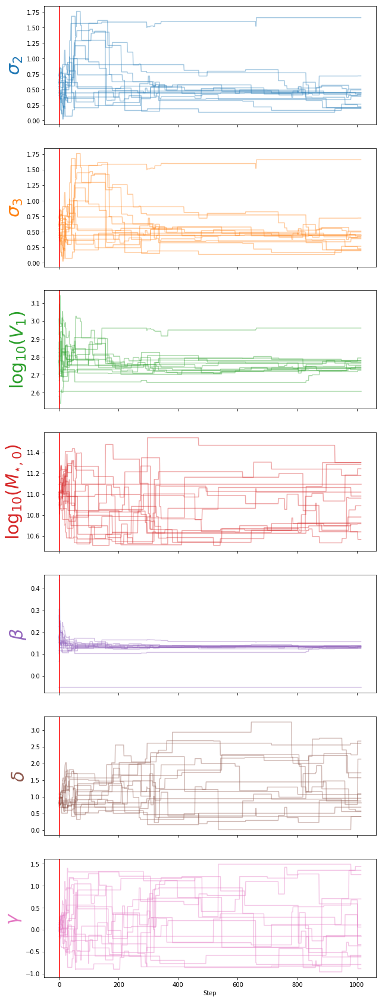

15210 iterations being used total


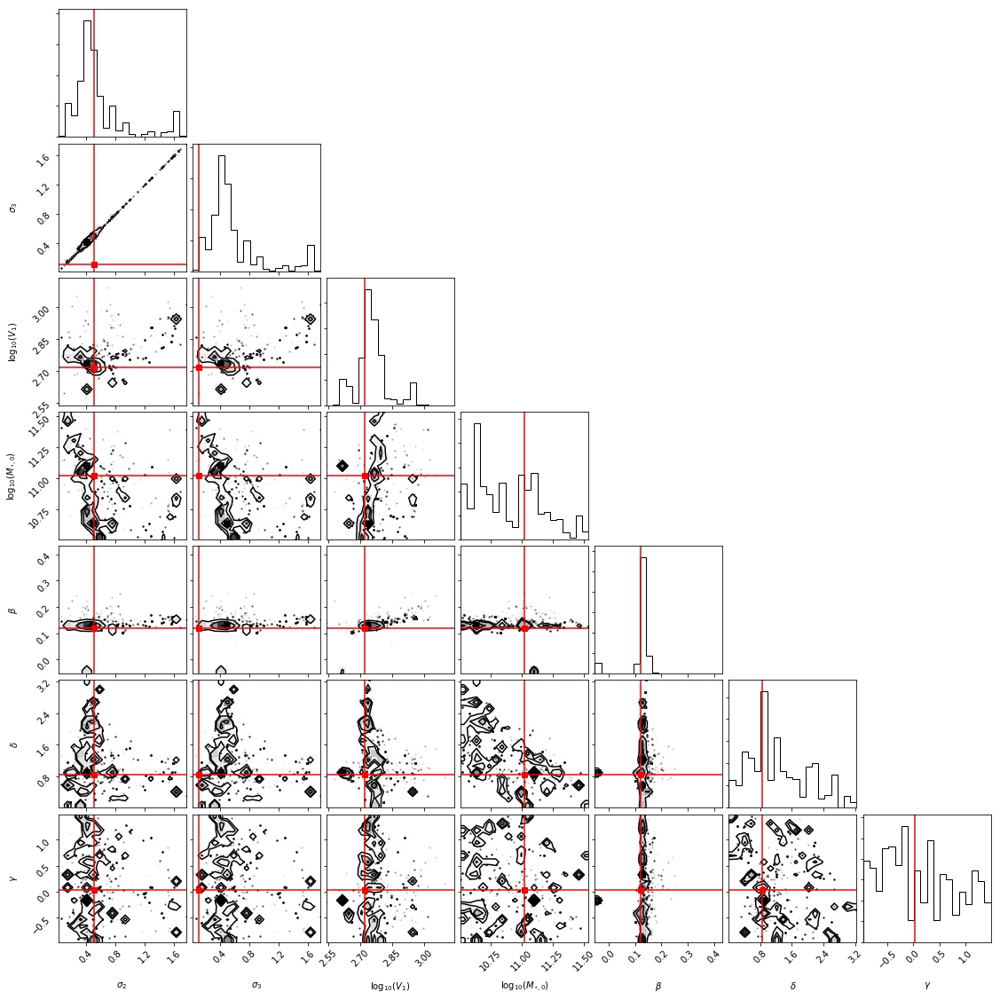

[ 0.26441385  0.26441385  2.7774918  11.17847893  0.13105593  0.55410668
  0.69755118]
USING CHRIS' CODE with halo_Vmax@Mpeak
SMF computed
cut galaxies table 1590494
Ks_2sampResult(statistic=0.0018970977958762125, pvalue=1.0000000000000002)
DS computed


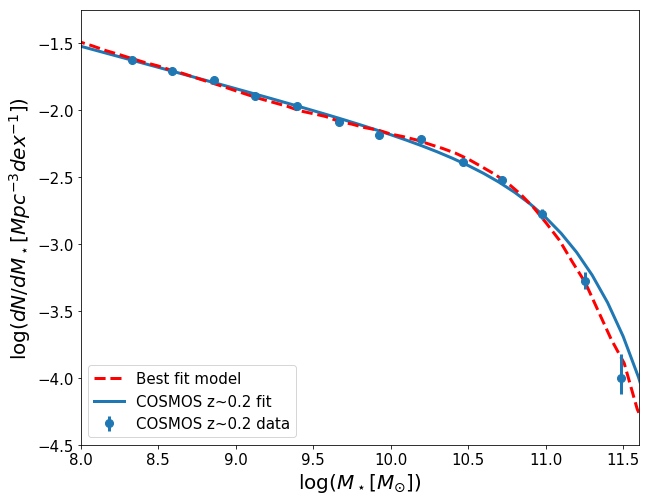

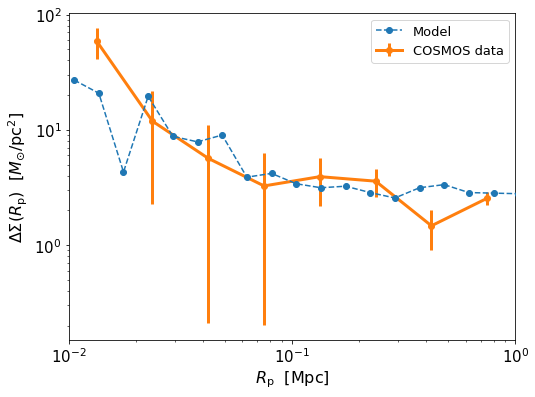

burn-in: 1
thin: 1
15 walkers
1016 iterations per walker so far (15240 total)
15225 iterations being used total


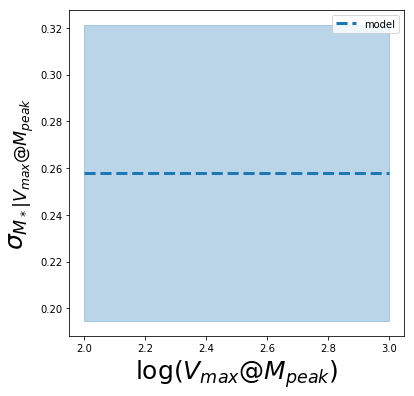

In [10]:
make_analysis_plots_hdf5('UM_flat_scattter')

5SHMR+scatter (Vmax@Mpeak)
burn-in: 1
thin: 1
15 walkers
511 iterations per walker so far (7665 total)


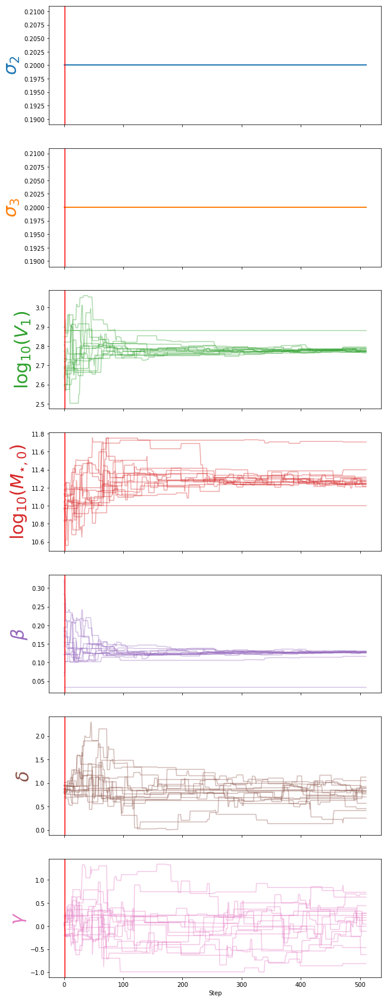

[ 0.2         0.2         2.76796451 11.24142313  0.12636682  0.83515726
  0.07274744]
USING CHRIS' CODE with halo_Vmax@Mpeak
SMF computed
cut galaxies table 1563495
Ks_2sampResult(statistic=0.0019132570615991717, pvalue=0.9999999999999998)
DS computed


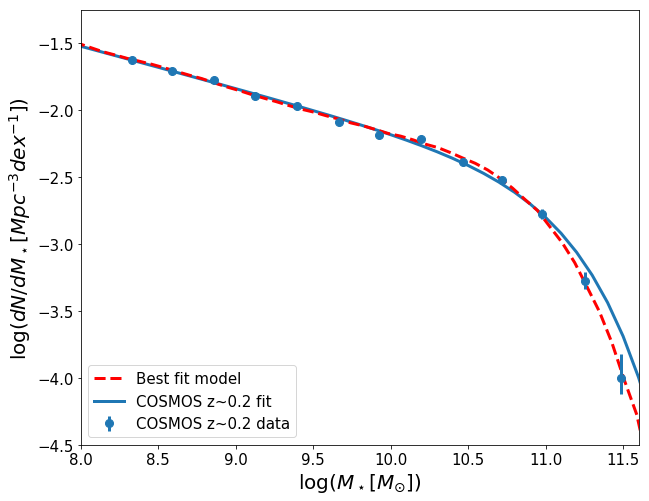

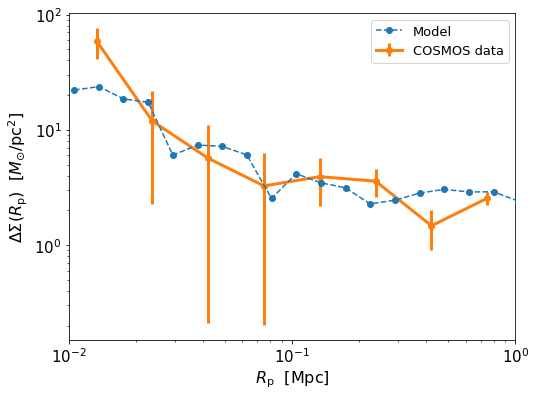

7650 iterations being used total


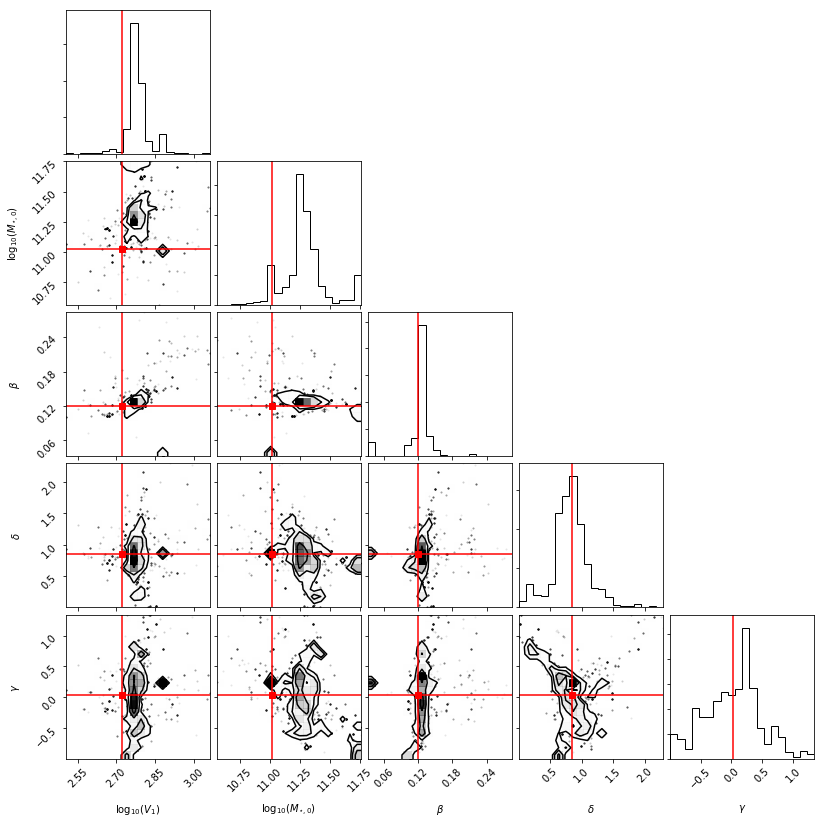

burn-in: 1
thin: 1
15 walkers
511 iterations per walker so far (7665 total)
7650 iterations being used total


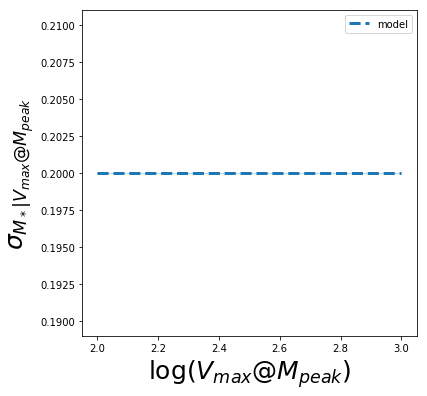

In [18]:
make_analysis_plots_hdf5('UM_fixed_scatter')

## asymetric variance

burn-in: 1
thin: 1
15 walkers
6892 iterations per walker so far (103380 total)
103365 iterations being used total
('positive: ', array([0.08782777, 0.08269497, 0.08006674, 0.0740398 , 0.06945638,
       0.06646064, 0.06111531, 0.05557467, 0.05105923, 0.04405387,
       0.0443196 , 0.04503959, 0.04069232, 0.03555146, 0.03244906,
       0.03048519, 0.02989115, 0.02854079, 0.03000942, 0.03233709,
       0.03619868, 0.03629101, 0.04726047, 0.05164465, 0.05291052]))
('negative: ', array([0.12774234, 0.12229698, 0.11556067, 0.11206565, 0.10746955,
       0.10109079, 0.09767563, 0.09437225, 0.09019713, 0.08924838,
       0.08040774, 0.07776755, 0.07080927, 0.06883865, 0.06583151,
       0.06293568, 0.05964982, 0.05821486, 0.05606818, 0.05434327,
       0.0534534 , 0.05465917, 0.05507153, 0.05437946, 0.05506722]))


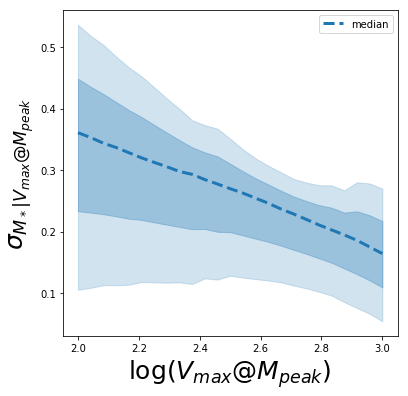

In [44]:
plot_sigma_slope('UM_1')

burn-in: 1
thin: 1
15 walkers
6893 iterations per walker so far (103395 total)
103380 iterations being used total
('positive: ', array([0.10597849, 0.10077979, 0.09594662, 0.09131363, 0.08645446,
       0.08172299, 0.07698309, 0.06952312, 0.06524967, 0.05982226,
       0.05568956, 0.05185285, 0.04896066, 0.04577569, 0.04282907,
       0.04079089, 0.04132226, 0.03881662, 0.03646289, 0.03648575,
       0.03806074, 0.04028941, 0.04258735, 0.04594132, 0.04857594]))
('negative: ', array([0.1089069 , 0.10467543, 0.10015107, 0.09550897, 0.09120594,
       0.08689227, 0.08273264, 0.0821589 , 0.07787609, 0.07567689,
       0.07187163, 0.06802845, 0.06312823, 0.05942901, 0.05619309,
       0.05250435, 0.04662193, 0.04575619, 0.04642819, 0.04512878,
       0.0430677 , 0.04179871, 0.04184502, 0.04196394, 0.04381759]))


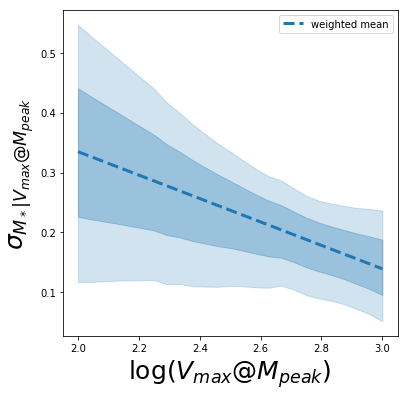

In [46]:
plot_sigma_slope('UM_1')

In [ ]:
#asymmetric standard deviation
def weighted_avg_and_std(values, weights):
    """
    Return the weighted average and standard deviation.

    values, weights -- Numpy ndarrays with the same shape.
    
    """
    values = np.array(values)
    average = np.average(values, weights=weights)
#     average = np.median(values)
    # Fast and numerically precise:  
    positive_variance = np.average((values[values>average]-average)**2, weights=weights[values>average])
    negative_variance = np.average((values[values<average]-average)**2, weights=weights[values<average])
    
    return (average, math.sqrt(positive_variance), math.sqrt(negative_variance))


def plot_sigma_slope(run):

    
    file_name = '/Users/fardila/Documents/GitHub/dwarf_lensing/MCMC/outfiles/UM_cosmos_bplanck_run_{0}.hdf5'.format(str(run))
    reader = emcee.backends.HDFBackend(file_name)
    
#     tau = reader.get_autocorr_time()
#     burnin = int(2*np.max(tau))
#     thin = int(0.5*np.min(tau))


    chains = reader.get_chain()
    log_prob = reader.get_log_prob()
    
    print("burn-in: {0}".format(burnin))
    print("thin: {0}".format(thin))
    print('{0} walkers'.format(chains.shape[1]))
    print('{0} iterations per walker so far ({1} total)'.format(chains.shape[0],
                                                                chains.shape[0]*chains.shape[1]))
    
    chains = reader.get_chain(discard=burnin, flat=True, thin=thin)
    log_prob = reader.get_log_prob(discard=burnin, flat=True, thin=thin)
    print('{0} iterations being used total'.format(chains.shape[0]))

    #only first 2 params
    sigma_2, sigma_3 =  chains.T[:2]

#     #flatten walker chains together
#     sigma_2_flat, sigma_3_flat = sigma_2.T.flatten(), sigma_3.T.flatten()
    
    #choose points to interpolate
    interp_Vs = np.linspace(2,3,25)
    interp_sigmas = [np.interp(interp_Vs, [2,3], [sigma2, sigma3]) for sigma2, sigma3 in zip(sigma_2, sigma_3)]
    
    #get means and sigmas
    means, positive_stds, negative_stds = [], [], []
    for i, V in enumerate(interp_Vs):
        samples = [sigmas[i] for sigmas in interp_sigmas]
        mean, positive_std, negative_std = weighted_avg_and_std(samples, np.exp(log_prob))

        means.append(mean)
        positive_stds.append(positive_std)
        negative_stds.append(negative_std)
        
    means = np.array(means)
    positive_stds = np.array(positive_stds)
    negative_stds = np.array(negative_stds)
    print('positive: ',positive_stds)
    print('negative: ',negative_stds)
        
    #plot
    fig, axes=plt.subplots(1,1, figsize=[6,6])
    
    #left subplot: Vmax@Mpeak
#     axes.errorbar(interp_Vs, means,yerr=stds,
#             c=plt.get_cmap('tab20')(0), linewidth=3, linestyle='--', marker='o', label = 'model')
    axes.plot(interp_Vs, means, c=plt.get_cmap('tab20')(0), linewidth=3, linestyle='--', label = 'weighted mean')
    axes.fill_between(interp_Vs, means+positive_stds, means-negative_stds,
                     color=plt.get_cmap('tab20')(0), alpha=0.3)
    axes.fill_between(interp_Vs, means+2*positive_stds, means-2*negative_stds,
                     color=plt.get_cmap('tab20')(0), alpha=0.2)

    axes.set_xlabel(r'$\log(V_{max}@M_{peak}$)', fontsize=25)
    axes.set_ylabel(r'$\sigma_{M_* | V_{max}@M_{peak}}$', fontsize=25)
    axes.legend()
    

    plt.show()

## comparing best fit models 

In [108]:
run = 'UM_fixed_scatter'
config = parse_config('/Users/fardila/Documents/GitHub/dwarf_lensing/MCMC/config/mcmc_config_{0}.yaml'.format(str(run)))
config, cosmos_data, sim_data = initial_model(config)


5SHMR+scatter (Vmax@Mpeak)


[0.2, 0.2, 2.76796451, 11.24142313, 0.12636682, 0.83515726, 0.07274744]
[0.31778976, 0.16864865, 2.76285812, 11.15042856, 0.12689323, 0.96288237, -0.03033116]
USING CHRIS' CODE with halo_Vmax@Mpeak
SMF computed
cut galaxies table 1563609
Ks_2sampResult(statistic=0.0021136319565638884, pvalue=0.9999999999999999)
DS computed
USING CHRIS' CODE with halo_Vmax@Mpeak
SMF computed
cut galaxies table 1576973
Ks_2sampResult(statistic=0.0018179173938336346, pvalue=1.0)
DS computed


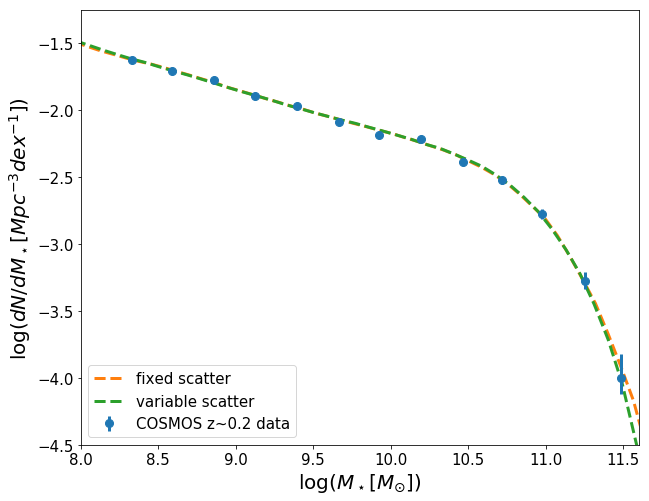

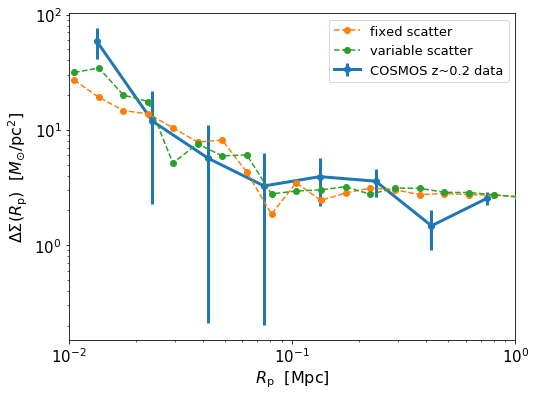

In [107]:
fixed_scatter_params = [ 0.2, 0.2, 2.76796451, 11.24142313, 0.12636682, 0.83515726, 0.07274744]
variable_scatter_params = [0.31778976, 0.16864865, 2.76285812, 11.15042856, 0.12689323,
                           0.96288237,  -0.03033116]
plot_from_params([fixed_scatter_params,variable_scatter_params], config, cosmos_data, sim_data,
                labels=['fixed scatter', 'variable scatter'])  
